In [1]:
basedir = '/home/abhinavgupta0110/NeuralODEs_ROM_Closure'

import os

is_google_colab = False
is_use_GPU = False

### Mount the Google drive if needed

In [2]:
if is_use_GPU:
    gpu_info = !nvidia-smi
    gpu_info = '\n'.join(gpu_info)
    if gpu_info.find('failed') >= 0:
        print('No GPU found!')
    else:
        print(gpu_info)

if is_google_colab:
    from google.colab import drive
    drive.mount('/content/drive')

    %pip install quadpy
    
os.chdir(os.path.join(basedir, 'neuralDDE_ROM_Closure'))

### Load modules

In [3]:
from src.utilities.DDE_Solver import ddeinttf 
import src.solvers.neuralDDE_with_adjoint as ndde
import src.advec_diff_case.advec_diff_eqn as adeq

import time
import sys
from IPython.core.debugger import set_trace

import numpy as np
import scipy as spy
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib import cm
from shutil import move

tf.keras.backend.set_floatx('float32')
import logging
tf.get_logger().setLevel(logging.ERROR)

## Define some useful classes

### Class for user-defined arguments

In [4]:
class res_ad_eq_nDDE_args(ndde.arguments, adeq.ad_eqn_args):

    def __init__(self, batch_time = 12, batch_time_skip = 2, batch_size = 5, epochs = 500, learning_rate = 0.05, decay_rate = 0.95, test_freq = 1, plot_freq = 2, 
                 d_max = 1.1, rnn_nmax = 3, rnn_dt = 0.5, state_dim = 2, adj_data_size = 2,
                 model_dir = 'ROM_nODE_testcase/model_dir_test', restart = 0, val_percentage = 0.2,
                 T = 2., nt = 200, L = 1., nx_high_res = 100, nx_low_res = 25, Re = 250, u_bc_0 = 0., u_bc_L =0., isplot = True): # add more arguments as needed
        
        ndde.arguments.__init__(self, data_size = nt, batch_time = batch_time, batch_time_skip = batch_time_skip, batch_size = batch_size, epochs = epochs,
                           learning_rate = learning_rate, decay_rate = decay_rate, test_freq = test_freq, plot_freq = plot_freq, d_max = d_max, rnn_nmax = rnn_nmax, 
                           rnn_dt = rnn_dt, state_dim = nx_low_res, adj_data_size = nx_low_res, model_dir = model_dir, restart = restart, val_percentage = val_percentage, isplot = isplot)

        adeq.ad_eqn_args.__init__(self, T = T, nt = nt, L = L, nx = nx_low_res, Re = Re, u_bc_0 = u_bc_0, u_bc_L = u_bc_L,
                              multi_solve_size = batch_size)
        
        self.args_for_high_res = adeq.ad_eqn_args(T = T, nt = nt, L = L, nx = nx_high_res, Re = Re, u_bc_0 = u_bc_0, u_bc_L = u_bc_L, 
                              multi_solve_size = 1)
        
        self.args_for_low_res = adeq.ad_eqn_args(T = T, nt = nt, L = L, nx = nx_low_res, Re = Re, u_bc_0 = u_bc_0, u_bc_L = u_bc_L, 
                              multi_solve_size = 1)
        
        self.nx_high_res = nx_high_res
        self.nx_low_res = nx_low_res

### Define the neural net architecture

In [5]:
class DDEFunc(tf.keras.Model):

    def __init__(self, gov_model, **kwargs):
        super(DDEFunc, self).__init__(**kwargs)
        
        self.x1 = tf.keras.layers.Dense(5, activation='tanh',
                                        kernel_initializer=tf.keras.initializers.TruncatedNormal(stddev=0.1), use_bias=False)
        
        self.x2 = tf.keras.layers.Dense(5, activation='tanh',
                                        kernel_initializer=tf.keras.initializers.TruncatedNormal(stddev=0.1), use_bias=True)
        
        self.out = tf.keras.layers.Dense(args.state_dim, activation='linear',
                                        kernel_initializer=tf.keras.initializers.TruncatedNormal(stddev=0.1), use_bias=True)
        
        self.gov_model = gov_model


    def call(self, y, t, d):
        y_nn = y(t)
        for i in range(len(self.layers)):
            y_nn = self.layers[i](y_nn)
        return y_nn + self.gov_model(y, t)

In [13]:
def interp_high_res_to_low_res(u_high_res, x_high_res, x_low_res, t):

    f = spy.interpolate.interp2d(x_high_res, t, tf.squeeze(u_high_res, axis=1).numpy(), kind='cubic')

    u_interp = tf.expand_dims(tf.convert_to_tensor(f(x_low_res, t), dtype=tf.float32), axis=1)

    return u_interp

### Define a custom loss function

In [6]:
class custom_loss(tf.keras.losses.Loss):

    def call(self, true_y, pred_y):
        loss = tf.reduce_mean(tf.sqrt(tf.reduce_sum(tf.math.squared_difference(pred_y, true_y), axis=-1)), axis=0)
        return loss

### Define a custom plotting function

In [7]:
class custom_plot:

    def __init__(self, true_y, y_no_nn, x, t, figsave_dir, args):
        self.true_y = true_y
        self.y_no_nn = y_no_nn
        self.t = t
        self.figsave_dir = figsave_dir
        self.args = args
        self.X, self.T = np.meshgrid(x.numpy(), t.numpy())
        self.x = x

    def plot(self, *pred_y, epoch = 0):
        fig = plt.figure(figsize=(24, 4), facecolor='white')
        ax_u_lowres = fig.add_subplot(141, projection='3d')
        ax_u_diff = fig.add_subplot(142, projection='3d')
        ax_u_nn = fig.add_subplot(143, projection='3d')
        ax_u_diff_nn = fig.add_subplot(144, projection='3d')

        ax_u_lowres.cla()
        ax_u_lowres.set_title('AD Eqn Low-Res Solution')
        ax_u_lowres.set_xlabel('x')
        ax_u_lowres.set_ylabel('t')
        ax_u_lowres.plot_surface(self.X, self.T, tf.squeeze(self.y_no_nn, axis=1).numpy(), cmap=cm.coolwarm,
                            linewidth=0, antialiased=False)
        ax_u_lowres.set_xlim(self.x[0], self.x[-1])
        ax_u_lowres.set_ylim(self.t[0], self.t[-1])

        ax_u_diff.cla()
        ax_u_diff.set_title('AD Eqn Difference without NN')
        ax_u_diff.set_xlabel('x')
        ax_u_diff.set_ylabel('t')
        ax_u_diff.plot_surface(self.X, self.T, tf.squeeze(self.true_y - self.y_no_nn, axis=1).numpy(), cmap=cm.coolwarm,
                            linewidth=0, antialiased=False)
        ax_u_diff.set_xlim(self.x[0], self.x[-1])
        ax_u_diff.set_ylim(self.t[0], self.t[-1])

        if epoch != 0 or self.args.restart == 1 :
            ax_u_nn.cla()
            ax_u_nn.set_title('AD Eqn with NN Low-Res Solution')
            ax_u_nn.set_xlabel('x')
            ax_u_nn.set_ylabel('t')
            ax_u_nn.plot_surface(self.X, self.T, tf.squeeze(pred_y[0], axis=1).numpy(), cmap=cm.coolwarm,
                                linewidth=0, antialiased=False)
            ax_u_nn.set_xlim(self.x[0], self.x[-1])
            ax_u_nn.set_ylim(self.t[0], self.t[-1])

            ax_u_diff_nn.cla()
            ax_u_diff_nn.set_title('AD Eqn Difference without NN')
            ax_u_diff_nn.set_xlabel('x')
            ax_u_diff_nn.set_ylabel('t')
            ax_u_diff_nn.plot_surface(self.X, self.T, tf.squeeze(self.true_y - pred_y[0], axis=1).numpy(), cmap=cm.coolwarm,
                                linewidth=0, antialiased=False)
            ax_u_diff_nn.set_xlim(self.x[0], self.x[-1])
            ax_u_diff_nn.set_ylim(self.t[0], self.t[-1])

        plt.show() 

        if epoch != 0: 
            fig.savefig(os.path.join(self.figsave_dir, 'img'+str(epoch)))

### Initial Conditions

In [8]:
class initial_cond:

    def __init__(self, x, app):
        self.x = x
        self.app = app

    def __call__(self, t):
        u0 = self.x / (1. + np.sqrt(1./self.app.t0) * np.exp(self.app.Re * self.x**2 / 4., dtype = np.float64))
        return tf.convert_to_tensor([u0], dtype=tf.float32)

### Initialize model related parameters

In [9]:
args = res_ad_eq_nDDE_args(batch_time = 6, batch_time_skip = 2, batch_size = 2, epochs = 500, learning_rate = 0.075, decay_rate = 0.97, test_freq = 1, plot_freq = 2,
                    d_max = 0.2, rnn_nmax = 1, rnn_dt = 0.1, model_dir = 'Res_nODE_testcase/model_dir_test', restart = 0, val_percentage = 1.,
                    T = 1.25, nt = 125, L = 1., nx_high_res = 100, nx_low_res = 25, Re = 1000, u_bc_0 = 0., u_bc_L =0.)

### Make a copy of the current script

In [10]:
os.chdir(basedir)

if not os.path.exists(args.model_dir):
    os.makedirs(args.model_dir)

checkpoint_dir = os.path.join(args.model_dir, "ckpt")
checkpoint_prefix = os.path.join(checkpoint_dir, "cp-{epoch:04d}.ckpt")
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

figsave_dir = os.path.join(args.model_dir, "img")
if not os.path.exists(figsave_dir):
    os.makedirs(figsave_dir)

!jupyter nbconvert --to python 'neuralDDE_ROM_Closure/testcases/AD_Eqn_Res/neuralODE_Res_AD_Eqn_TestCase.ipynb'
move("neuralDDE_ROM_Closure/testcases/AD_Eqn_Res/neuralODE_Res_AD_Eqn_TestCase.py", os.path.join(args.model_dir, "orig_run_file.py"))

[NbConvertApp] Converting notebook neuralDDE_ROM_Closure/testcases/AD_Eqn_Res/neuralODE_Res_AD_Eqn_TestCase.ipynb to python
[NbConvertApp] Writing 11783 bytes to neuralDDE_ROM_Closure/testcases/AD_Eqn_Res/neuralODE_Res_AD_Eqn_TestCase.py


'Res_nODE_testcase/model_dir_test/orig_run_file.py'

### Solve for the high resolution model

In [11]:
x_high_res = tf.linspace(0., args.L, args.nx_high_res)
t = tf.linspace(0., args.T, args.nt) # Time array

u0 = initial_cond(x_high_res, args.args_for_high_res) # Initial conditions

op = adeq.operators(args.args_for_high_res)

u_high_res = ddeinttf(adeq.ad_eqn(op), u0, t)

# Compute FOM for the validation time
dt = t[1] - t[0]
val_t_len =  args.val_percentage * (t[-1] - t[0])
n_val = np.ceil(np.abs(val_t_len/dt.numpy())).astype(int)
val_t = tf.linspace(t[-1], t[-1] + val_t_len, n_val)

val_u_high_res = ddeinttf(adeq.ad_eqn(op), ndde.create_interpolator(u_high_res, t), val_t)

print('High resolution model done!')

High resolution model done!


### Solve for low resolution model

In [12]:
x_low_res = tf.linspace(0., args.L, args.nx_low_res)

u0 = initial_cond(x_low_res, args.args_for_low_res) # Initial conditions

op = adeq.operators(args.args_for_low_res)

u_low_res = ddeinttf(adeq.ad_eqn(op), u0, t)

print('Low resolution model done!')

Low resolution model done!


In [14]:
# Interpolate high resolution solution on low resolution grid

true_u_low_res = interp_high_res_to_low_res(u_high_res, x_high_res, x_low_res, t)

val_true_u_low_res = interp_high_res_to_low_res(val_u_high_res, x_high_res, x_low_res, val_t)


## Main part starts here

### Make objects and define learning-rate schedule

In [15]:
time_meter = ndde.RunningAverageMeter(0.97)

func = DDEFunc(adeq.ad_eqn(op = adeq.operators(args)))
adj_func = ndde.adj_eqn_ODE(func, args)
get_batch = ndde.create_batch(true_u_low_res, u0, t, args)
loss_obj = custom_loss()
plot_obj = custom_plot(true_u_low_res, u_low_res, x_low_res, t, figsave_dir, args)
loss_history = ndde.history(args)
val_obj = ndde.create_validation_set(u0, t, args)

initial_learning_rate = args.learning_rate
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=args.niters,
    decay_rate=args.decay_rate,
    staircase=True)

### Quick test to see how the true coefficients looks like

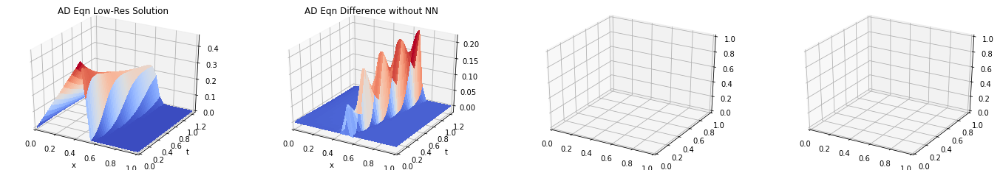

In [16]:
if args.restart == 1: 
    func.load_weights(tf.train.latest_checkpoint(checkpoint_dir))
    pred_y = ddeinttf(func, u0, t, fargs=([args.rnn_nmax, args.rnn_dt],))
    
    plot_obj.plot(pred_y, epoch = 0)

    loss_history.read()
    
    initial_learning_rate = 0.05
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate, decay_steps=args.niters, decay_rate=0.95, staircase=True)
    
else:
    plot_obj.plot(epoch = 0)

### Training starts here

Epoch 0000 | Train Loss 0.181539 | Val Loss 0.093630 | Time Elapsed 0.0000 mins


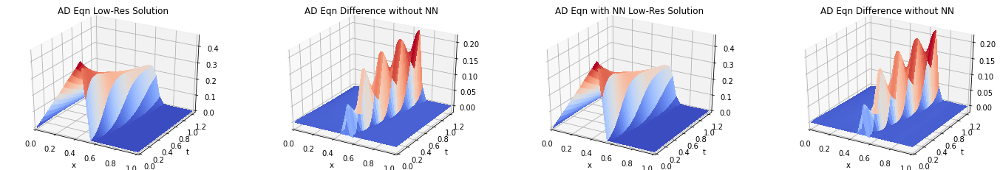

Iterations: 100%|██████████| 12/12 [04:42<00:00, 23.51s/it]
Epoch 0001 | Train Loss 0.202037 | Val Loss 0.139838 | LR 0.0750| Time Elapsed 4.8789 mins
Iterations: 100%|██████████| 12/12 [04:32<00:00, 22.74s/it]
Epoch 0002 | Train Loss 0.167723 | Val Loss 0.239667 | LR 0.0728| Time Elapsed 4.8690 mins


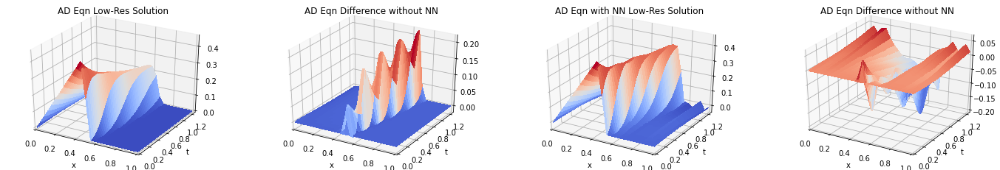

Iterations: 100%|██████████| 12/12 [04:32<00:00, 22.69s/it]
Epoch 0003 | Train Loss 0.161342 | Val Loss 0.120252 | LR 0.0706| Time Elapsed 4.8591 mins
Iterations: 100%|██████████| 12/12 [04:37<00:00, 23.14s/it]
Epoch 0004 | Train Loss 0.153365 | Val Loss 0.111221 | LR 0.0685| Time Elapsed 4.8522 mins


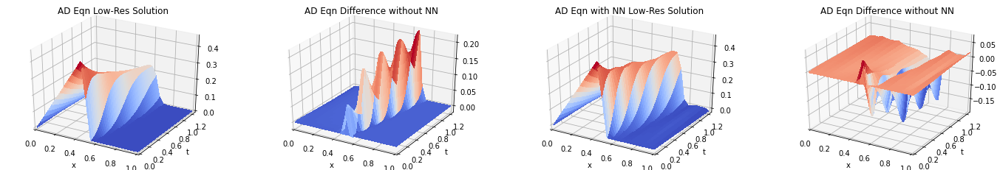

Iterations: 100%|██████████| 12/12 [04:43<00:00, 23.61s/it]
Epoch 0005 | Train Loss 0.167805 | Val Loss 0.142626 | LR 0.0664| Time Elapsed 4.8482 mins
Iterations: 100%|██████████| 12/12 [04:34<00:00, 22.85s/it]
Epoch 0006 | Train Loss 0.140461 | Val Loss 0.118300 | LR 0.0644| Time Elapsed 4.8399 mins


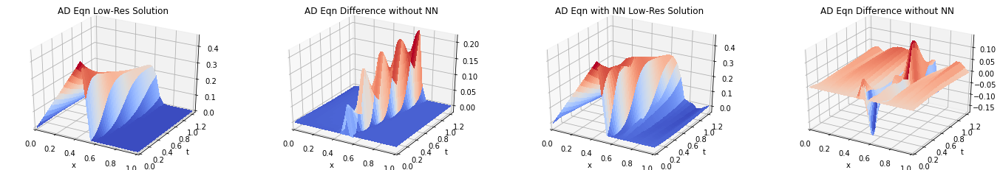

Iterations: 100%|██████████| 12/12 [04:30<00:00, 22.58s/it]
Epoch 0007 | Train Loss 0.184776 | Val Loss 0.112542 | LR 0.0625| Time Elapsed 4.8302 mins
Iterations: 100%|██████████| 12/12 [04:40<00:00, 23.40s/it]
Epoch 0008 | Train Loss 0.160477 | Val Loss 0.222813 | LR 0.0606| Time Elapsed 4.8257 mins


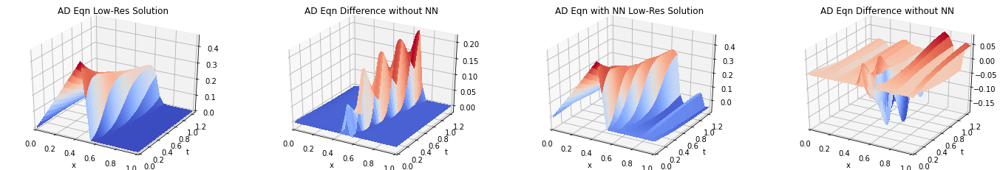

Iterations: 100%|██████████| 12/12 [04:42<00:00, 23.55s/it]
Epoch 0009 | Train Loss 0.115983 | Val Loss 0.146876 | LR 0.0588| Time Elapsed 4.8223 mins
Iterations: 100%|██████████| 12/12 [04:47<00:00, 23.92s/it]
Epoch 0010 | Train Loss 0.098961 | Val Loss 0.109689 | LR 0.0570| Time Elapsed 4.8211 mins


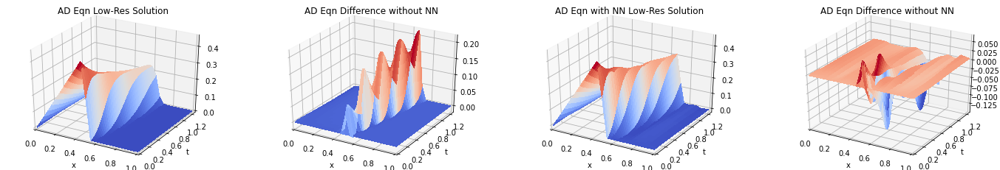

Iterations: 100%|██████████| 12/12 [04:52<00:00, 24.37s/it]
Epoch 0011 | Train Loss 0.173817 | Val Loss 0.133379 | LR 0.0553| Time Elapsed 4.8227 mins
Iterations: 100%|██████████| 12/12 [04:53<00:00, 24.43s/it]
Epoch 0012 | Train Loss 0.108463 | Val Loss 0.115084 | LR 0.0536| Time Elapsed 4.8247 mins


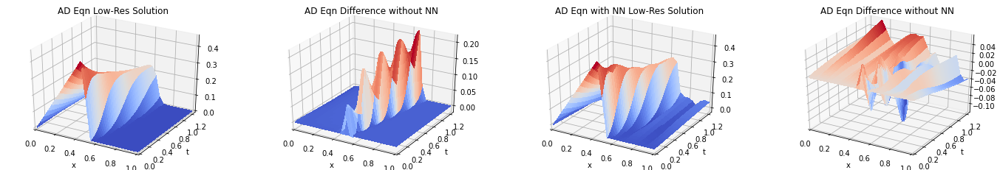

Iterations: 100%|██████████| 12/12 [04:47<00:00, 23.94s/it]
Epoch 0013 | Train Loss 0.111234 | Val Loss 0.157978 | LR 0.0520| Time Elapsed 4.8235 mins
Iterations: 100%|██████████| 12/12 [04:40<00:00, 23.34s/it]
Epoch 0014 | Train Loss 0.104387 | Val Loss 0.192291 | LR 0.0505| Time Elapsed 4.8189 mins


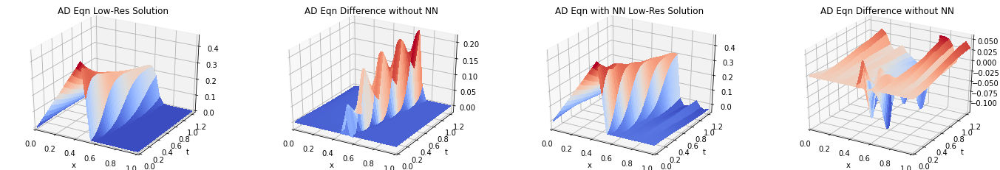

Iterations: 100%|██████████| 12/12 [04:50<00:00, 24.22s/it]
Epoch 0015 | Train Loss 0.138825 | Val Loss 0.110653 | LR 0.0490| Time Elapsed 4.8196 mins
Iterations: 100%|██████████| 12/12 [04:58<00:00, 24.89s/it]
Epoch 0016 | Train Loss 0.106893 | Val Loss 0.146735 | LR 0.0475| Time Elapsed 4.8244 mins


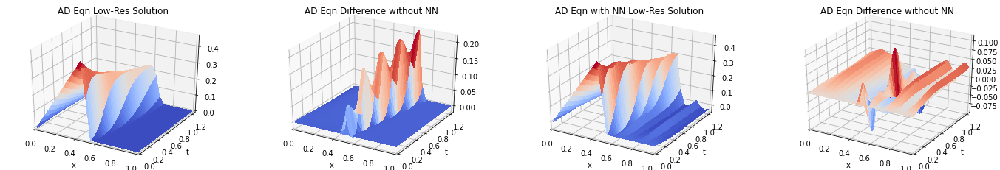

Iterations: 100%|██████████| 12/12 [05:08<00:00, 25.75s/it]
Epoch 0017 | Train Loss 0.094591 | Val Loss 0.082952 | LR 0.0461| Time Elapsed 4.8341 mins
Iterations: 100%|██████████| 12/12 [05:10<00:00, 25.89s/it]
Epoch 0018 | Train Loss 0.089582 | Val Loss 0.104232 | LR 0.0447| Time Elapsed 4.8445 mins


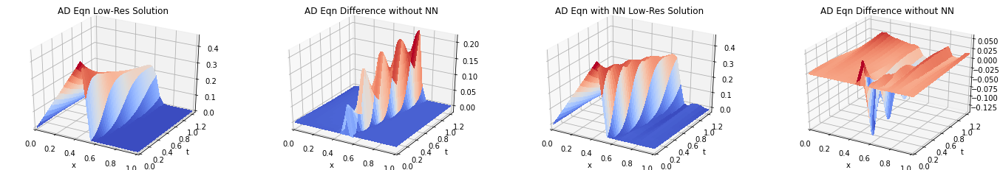

Iterations: 100%|██████████| 12/12 [05:01<00:00, 25.10s/it]
Epoch 0019 | Train Loss 0.111221 | Val Loss 0.083162 | LR 0.0433| Time Elapsed 4.8497 mins
Iterations: 100%|██████████| 12/12 [04:53<00:00, 24.46s/it]
Epoch 0020 | Train Loss 0.133771 | Val Loss 0.222798 | LR 0.0420| Time Elapsed 4.8510 mins


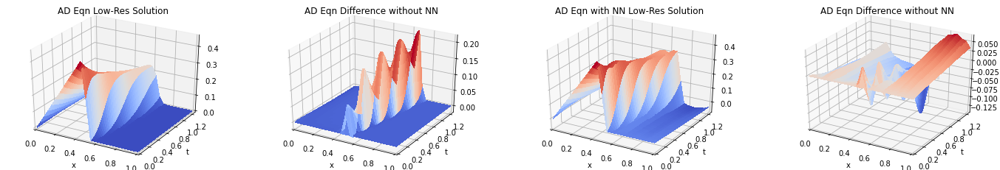

Iterations: 100%|██████████| 12/12 [05:09<00:00, 25.76s/it]
Epoch 0021 | Train Loss 0.085776 | Val Loss 0.104387 | LR 0.0408| Time Elapsed 4.8600 mins
Iterations: 100%|██████████| 12/12 [04:54<00:00, 24.54s/it]
Epoch 0022 | Train Loss 0.083474 | Val Loss 0.239857 | LR 0.0396| Time Elapsed 4.8615 mins


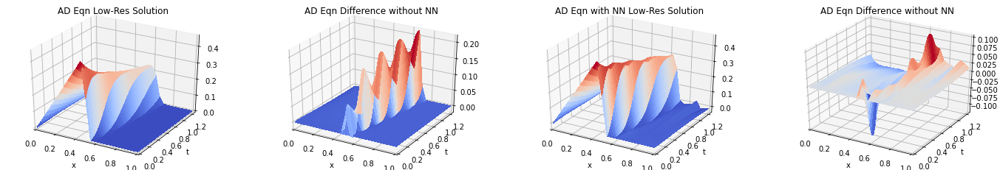

Iterations: 100%|██████████| 12/12 [04:58<00:00, 24.91s/it]
Epoch 0023 | Train Loss 0.201155 | Val Loss 0.102315 | LR 0.0384| Time Elapsed 4.8651 mins
Iterations: 100%|██████████| 12/12 [04:53<00:00, 24.42s/it]
Epoch 0024 | Train Loss 0.101199 | Val Loss 0.196965 | LR 0.0372| Time Elapsed 4.8656 mins


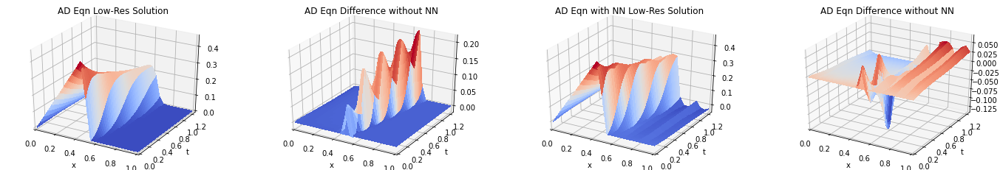

Iterations: 100%|██████████| 12/12 [05:02<00:00, 25.23s/it]
Epoch 0025 | Train Loss 0.148320 | Val Loss 0.265117 | LR 0.0361| Time Elapsed 4.8711 mins
Iterations: 100%|██████████| 12/12 [04:43<00:00, 23.65s/it]
Epoch 0026 | Train Loss 0.106494 | Val Loss 0.120623 | LR 0.0350| Time Elapsed 4.8668 mins


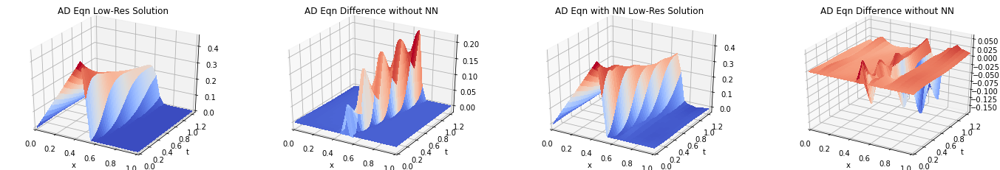

Iterations: 100%|██████████| 12/12 [04:59<00:00, 24.94s/it]
Epoch 0027 | Train Loss 0.091287 | Val Loss 0.195492 | LR 0.0340| Time Elapsed 4.8705 mins
Iterations: 100%|██████████| 12/12 [04:50<00:00, 24.19s/it]
Epoch 0028 | Train Loss 0.087667 | Val Loss 0.071403 | LR 0.0330| Time Elapsed 4.8695 mins


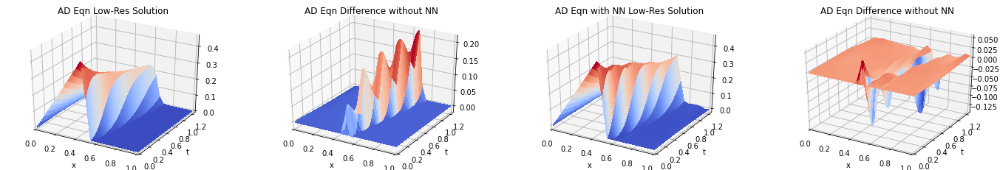

Iterations: 100%|██████████| 12/12 [05:04<00:00, 25.41s/it]
Epoch 0029 | Train Loss 0.129952 | Val Loss 0.085587 | LR 0.0320| Time Elapsed 4.8758 mins
Iterations: 100%|██████████| 12/12 [04:55<00:00, 24.65s/it]
Epoch 0030 | Train Loss 0.090196 | Val Loss 0.094286 | LR 0.0310| Time Elapsed 4.8775 mins


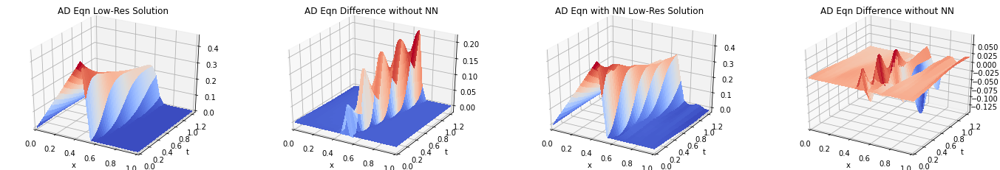

Iterations: 100%|██████████| 12/12 [05:02<00:00, 25.17s/it]
Epoch 0031 | Train Loss 0.093653 | Val Loss 0.213035 | LR 0.0301| Time Elapsed 4.8822 mins
Iterations: 100%|██████████| 12/12 [04:57<00:00, 24.83s/it]
Epoch 0032 | Train Loss 0.093093 | Val Loss 0.139860 | LR 0.0292| Time Elapsed 4.8847 mins


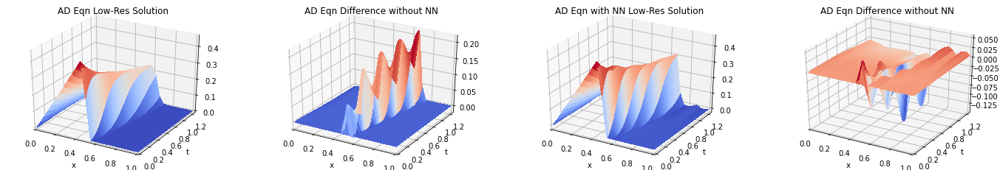

Iterations: 100%|██████████| 12/12 [05:03<00:00, 25.32s/it]
Epoch 0033 | Train Loss 0.043044 | Val Loss 0.107935 | LR 0.0283| Time Elapsed 4.8901 mins
Iterations: 100%|██████████| 12/12 [05:17<00:00, 26.46s/it]
Epoch 0034 | Train Loss 0.095400 | Val Loss 0.138378 | LR 0.0274| Time Elapsed 4.9021 mins


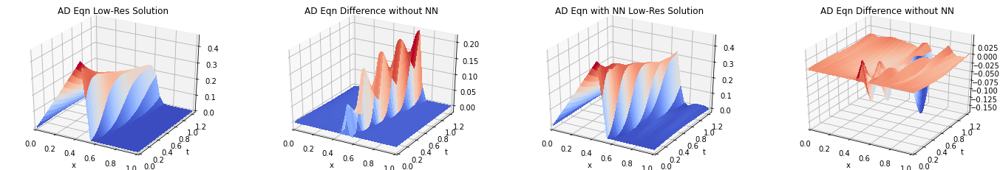

Iterations: 100%|██████████| 12/12 [04:59<00:00, 24.95s/it]
Epoch 0035 | Train Loss 0.078439 | Val Loss 0.098906 | LR 0.0266| Time Elapsed 4.9048 mins
Iterations: 100%|██████████| 12/12 [05:13<00:00, 26.12s/it]
Epoch 0036 | Train Loss 0.135423 | Val Loss 0.079812 | LR 0.0258| Time Elapsed 4.9144 mins


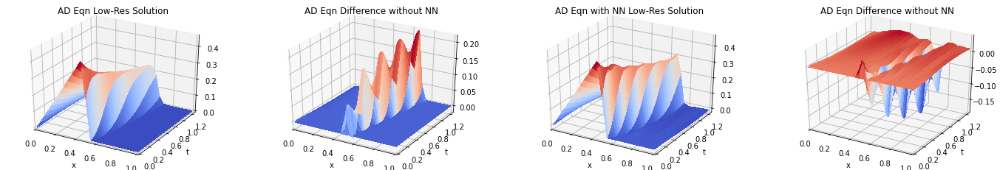

Iterations: 100%|██████████| 12/12 [05:04<00:00, 25.40s/it]
Epoch 0037 | Train Loss 0.108982 | Val Loss 0.073771 | LR 0.0251| Time Elapsed 4.9193 mins
Iterations: 100%|██████████| 12/12 [05:08<00:00, 25.72s/it]
Epoch 0038 | Train Loss 0.133781 | Val Loss 0.160697 | LR 0.0243| Time Elapsed 4.9261 mins


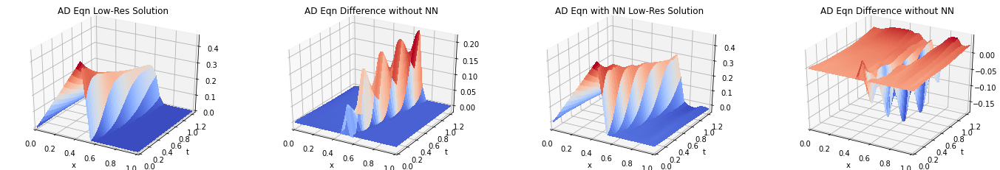

Iterations: 100%|██████████| 12/12 [04:52<00:00, 24.34s/it]
Epoch 0039 | Train Loss 0.079393 | Val Loss 0.107948 | LR 0.0236| Time Elapsed 4.9243 mins
Iterations: 100%|██████████| 12/12 [05:27<00:00, 27.33s/it]
Epoch 0040 | Train Loss 0.116504 | Val Loss 0.094774 | LR 0.0229| Time Elapsed 4.9406 mins


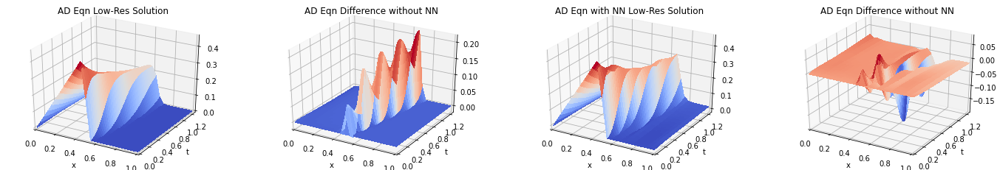

Iterations: 100%|██████████| 12/12 [05:01<00:00, 25.11s/it]
Epoch 0041 | Train Loss 0.099328 | Val Loss 0.073804 | LR 0.0222| Time Elapsed 4.9430 mins
Iterations: 100%|██████████| 12/12 [05:10<00:00, 25.86s/it]
Epoch 0042 | Train Loss 0.058410 | Val Loss 0.086359 | LR 0.0215| Time Elapsed 4.9499 mins


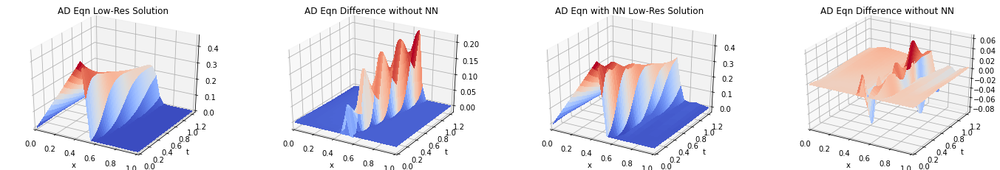

Iterations: 100%|██████████| 12/12 [05:38<00:00, 28.17s/it]
Epoch 0043 | Train Loss 0.093113 | Val Loss 0.085759 | LR 0.0209| Time Elapsed 4.9704 mins
Iterations: 100%|██████████| 12/12 [05:12<00:00, 26.01s/it]
Epoch 0044 | Train Loss 0.075781 | Val Loss 0.080564 | LR 0.0202| Time Elapsed 4.9774 mins


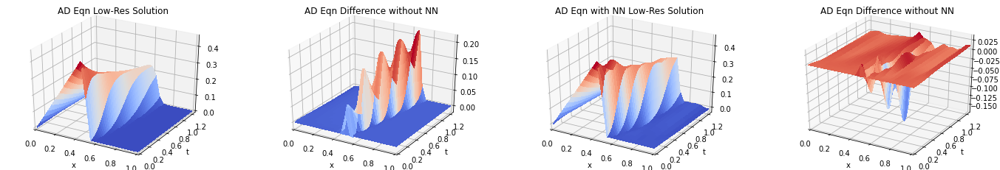

Iterations: 100%|██████████| 12/12 [05:15<00:00, 26.26s/it]
Epoch 0045 | Train Loss 0.085197 | Val Loss 0.076706 | LR 0.0196| Time Elapsed 4.9857 mins
Iterations: 100%|██████████| 12/12 [05:16<00:00, 26.37s/it]
Epoch 0046 | Train Loss 0.110289 | Val Loss 0.100155 | LR 0.0190| Time Elapsed 4.9943 mins


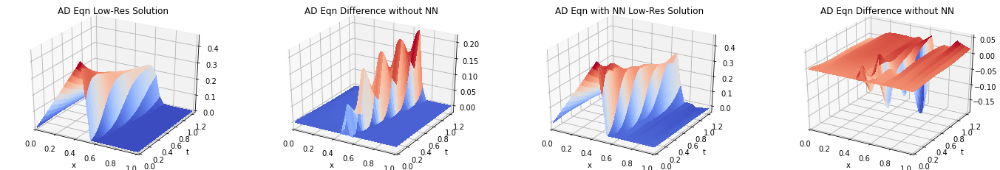

Iterations: 100%|██████████| 12/12 [05:18<00:00, 26.56s/it]
Epoch 0047 | Train Loss 0.087820 | Val Loss 0.086226 | LR 0.0185| Time Elapsed 5.0038 mins
Iterations: 100%|██████████| 12/12 [05:14<00:00, 26.18s/it]
Epoch 0048 | Train Loss 0.083031 | Val Loss 0.118664 | LR 0.0179| Time Elapsed 5.0108 mins


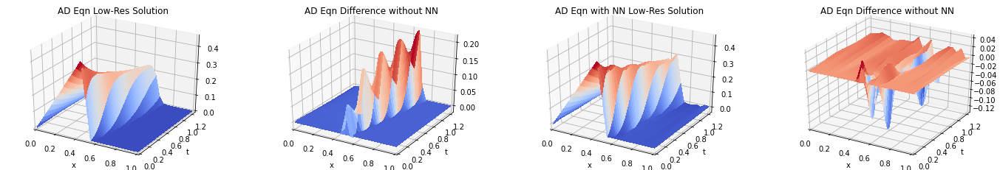

Iterations: 100%|██████████| 12/12 [05:21<00:00, 26.77s/it]
Epoch 0049 | Train Loss 0.130122 | Val Loss 0.083157 | LR 0.0174| Time Elapsed 5.0211 mins
Iterations: 100%|██████████| 12/12 [05:27<00:00, 27.32s/it]
Epoch 0050 | Train Loss 0.125659 | Val Loss 0.086361 | LR 0.0169| Time Elapsed 5.0344 mins


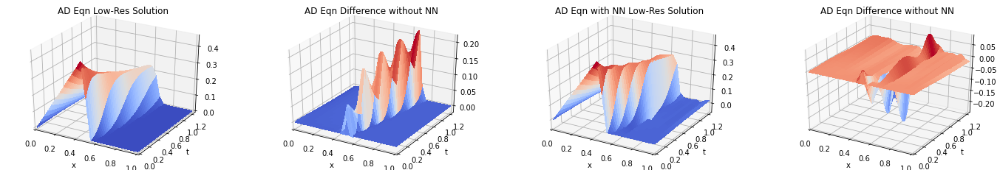

Iterations: 100%|██████████| 12/12 [05:29<00:00, 27.45s/it]
Epoch 0051 | Train Loss 0.104751 | Val Loss 0.091403 | LR 0.0164| Time Elapsed 5.0481 mins
Iterations: 100%|██████████| 12/12 [05:09<00:00, 25.77s/it]
Epoch 0052 | Train Loss 0.056819 | Val Loss 0.108240 | LR 0.0159| Time Elapsed 5.0512 mins


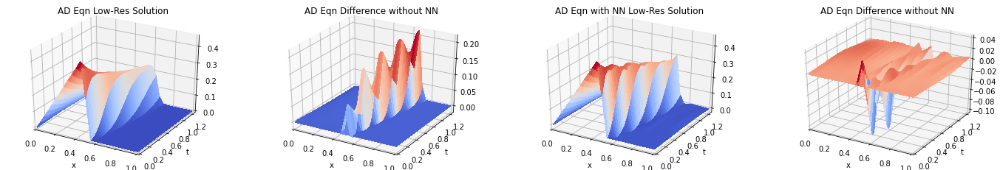

Iterations: 100%|██████████| 12/12 [05:25<00:00, 27.13s/it]
Epoch 0053 | Train Loss 0.041088 | Val Loss 0.096806 | LR 0.0154| Time Elapsed 5.0625 mins
Iterations: 100%|██████████| 12/12 [05:23<00:00, 27.00s/it]
Epoch 0054 | Train Loss 0.079490 | Val Loss 0.075762 | LR 0.0149| Time Elapsed 5.0726 mins


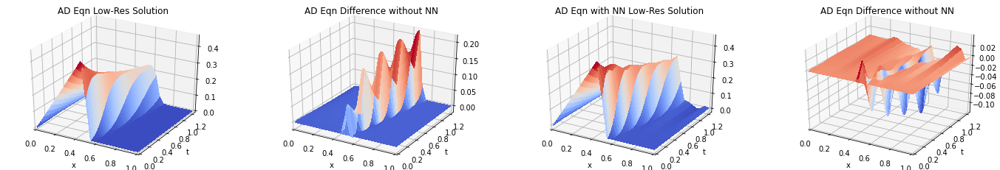

Iterations: 100%|██████████| 12/12 [05:28<00:00, 27.37s/it]
Epoch 0055 | Train Loss 0.108954 | Val Loss 0.074438 | LR 0.0145| Time Elapsed 5.0847 mins
Iterations: 100%|██████████| 12/12 [05:27<00:00, 27.33s/it]
Epoch 0056 | Train Loss 0.046892 | Val Loss 0.103977 | LR 0.0140| Time Elapsed 5.0961 mins


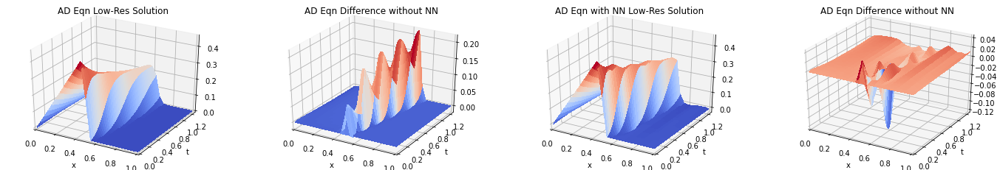

Iterations: 100%|██████████| 12/12 [05:21<00:00, 26.78s/it]
Epoch 0057 | Train Loss 0.091791 | Val Loss 0.075844 | LR 0.0136| Time Elapsed 5.1039 mins
Iterations: 100%|██████████| 12/12 [05:22<00:00, 26.88s/it]
Epoch 0058 | Train Loss 0.075878 | Val Loss 0.073544 | LR 0.0132| Time Elapsed 5.1121 mins


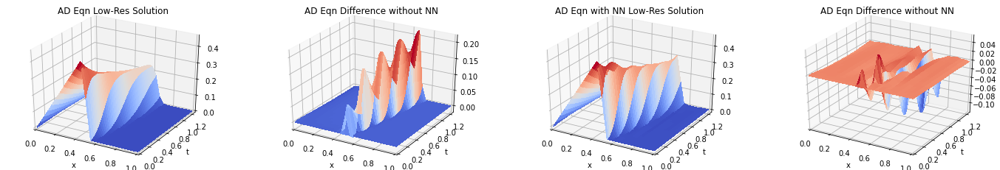

Iterations: 100%|██████████| 12/12 [05:22<00:00, 26.89s/it]
Epoch 0059 | Train Loss 0.057293 | Val Loss 0.074162 | LR 0.0128| Time Elapsed 5.1201 mins
Iterations: 100%|██████████| 12/12 [05:17<00:00, 26.44s/it]
Epoch 0060 | Train Loss 0.084853 | Val Loss 0.079819 | LR 0.0124| Time Elapsed 5.1251 mins


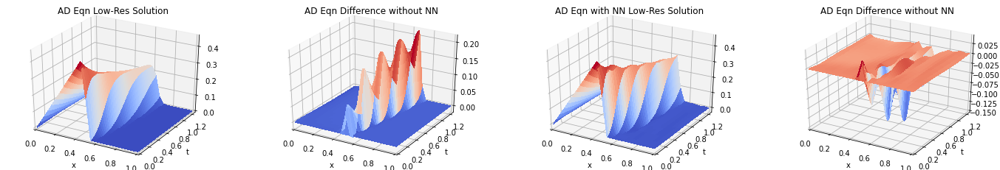

Iterations: 100%|██████████| 12/12 [05:22<00:00, 26.91s/it]
Epoch 0061 | Train Loss 0.055364 | Val Loss 0.114432 | LR 0.0121| Time Elapsed 5.1328 mins
Iterations: 100%|██████████| 12/12 [05:18<00:00, 26.54s/it]
Epoch 0062 | Train Loss 0.054822 | Val Loss 0.101616 | LR 0.0117| Time Elapsed 5.1381 mins


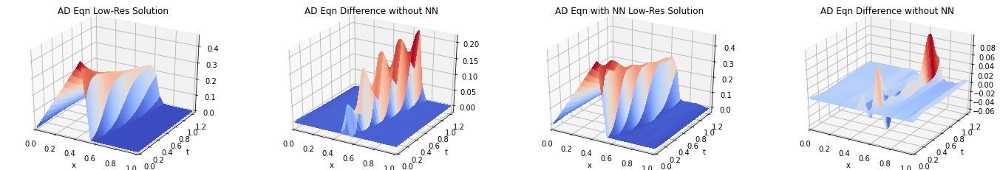

Iterations: 100%|██████████| 12/12 [05:33<00:00, 27.78s/it]
Epoch 0063 | Train Loss 0.064030 | Val Loss 0.091983 | LR 0.0113| Time Elapsed 5.1506 mins
Iterations: 100%|██████████| 12/12 [05:15<00:00, 26.30s/it]
Epoch 0064 | Train Loss 0.084601 | Val Loss 0.099976 | LR 0.0110| Time Elapsed 5.1539 mins


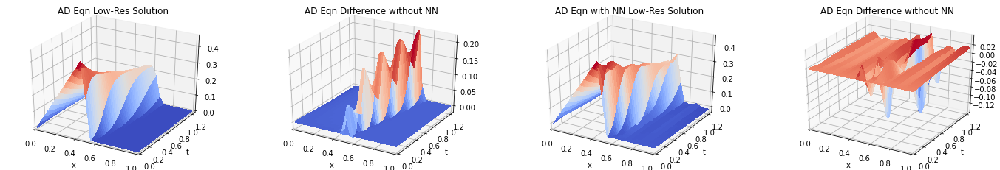

Iterations: 100%|██████████| 12/12 [05:30<00:00, 27.52s/it]
Epoch 0065 | Train Loss 0.077920 | Val Loss 0.087652 | LR 0.0107| Time Elapsed 5.1644 mins
Iterations: 100%|██████████| 12/12 [05:22<00:00, 26.88s/it]
Epoch 0066 | Train Loss 0.078424 | Val Loss 0.097580 | LR 0.0104| Time Elapsed 5.1708 mins


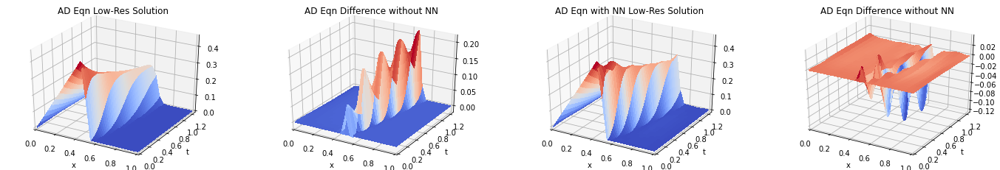

Iterations: 100%|██████████| 12/12 [05:16<00:00, 26.34s/it]
Epoch 0067 | Train Loss 0.065801 | Val Loss 0.077072 | LR 0.0100| Time Elapsed 5.1737 mins
Iterations: 100%|██████████| 12/12 [05:34<00:00, 27.89s/it]
Epoch 0068 | Train Loss 0.098077 | Val Loss 0.078607 | LR 0.0097| Time Elapsed 5.1858 mins


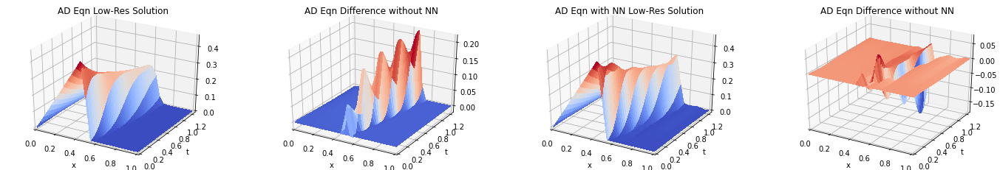

Iterations: 100%|██████████| 12/12 [05:13<00:00, 26.13s/it]
Epoch 0069 | Train Loss 0.084320 | Val Loss 0.079776 | LR 0.0095| Time Elapsed 5.1870 mins
Iterations: 100%|██████████| 12/12 [05:24<00:00, 27.03s/it]
Epoch 0070 | Train Loss 0.056270 | Val Loss 0.083558 | LR 0.0092| Time Elapsed 5.1936 mins


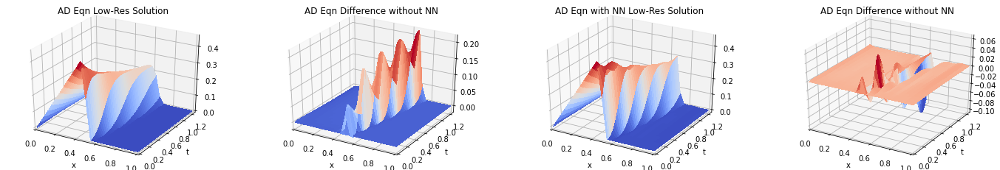

Iterations: 100%|██████████| 12/12 [05:07<00:00, 25.66s/it]
Epoch 0071 | Train Loss 0.065957 | Val Loss 0.074275 | LR 0.0089| Time Elapsed 5.1917 mins
Iterations: 100%|██████████| 12/12 [05:18<00:00, 26.57s/it]
Epoch 0072 | Train Loss 0.062376 | Val Loss 0.096739 | LR 0.0086| Time Elapsed 5.1954 mins


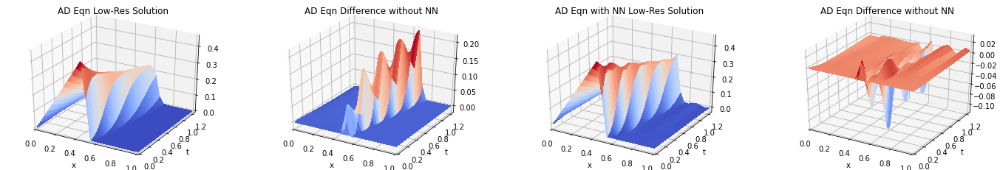

Iterations: 100%|██████████| 12/12 [05:21<00:00, 26.81s/it]
Epoch 0073 | Train Loss 0.063692 | Val Loss 0.084610 | LR 0.0084| Time Elapsed 5.2004 mins
Iterations: 100%|██████████| 12/12 [05:00<00:00, 25.02s/it]
Epoch 0074 | Train Loss 0.068367 | Val Loss 0.083023 | LR 0.0081| Time Elapsed 5.1945 mins


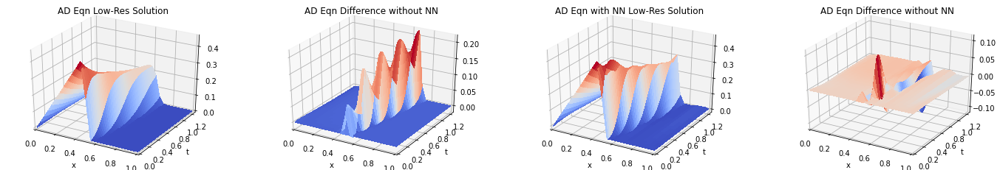

Iterations: 100%|██████████| 12/12 [05:21<00:00, 26.81s/it]
Epoch 0075 | Train Loss 0.061690 | Val Loss 0.081162 | LR 0.0079| Time Elapsed 5.1995 mins
Iterations: 100%|██████████| 12/12 [05:15<00:00, 26.30s/it]
Epoch 0076 | Train Loss 0.057534 | Val Loss 0.075597 | LR 0.0076| Time Elapsed 5.2013 mins


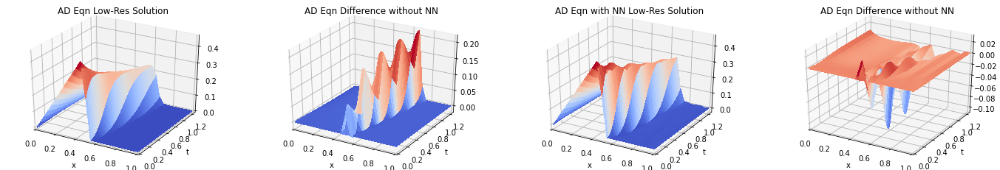

Iterations: 100%|██████████| 12/12 [05:04<00:00, 25.37s/it]
Epoch 0077 | Train Loss 0.087146 | Val Loss 0.078274 | LR 0.0074| Time Elapsed 5.1975 mins
Iterations: 100%|██████████| 12/12 [05:20<00:00, 26.69s/it]
Epoch 0078 | Train Loss 0.054950 | Val Loss 0.081412 | LR 0.0072| Time Elapsed 5.2017 mins


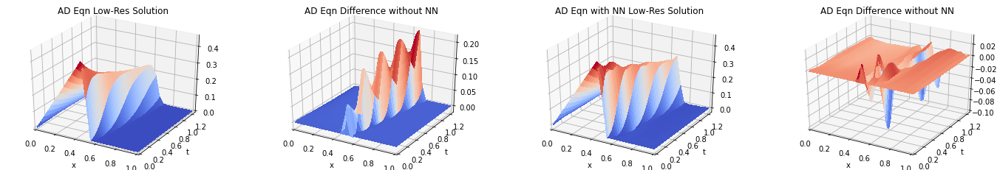

Iterations: 100%|██████████| 12/12 [05:09<00:00, 25.81s/it]
Epoch 0079 | Train Loss 0.052254 | Val Loss 0.075842 | LR 0.0070| Time Elapsed 5.2006 mins
Iterations: 100%|██████████| 12/12 [04:49<00:00, 24.14s/it]
Epoch 0080 | Train Loss 0.062999 | Val Loss 0.078412 | LR 0.0068| Time Elapsed 5.1894 mins


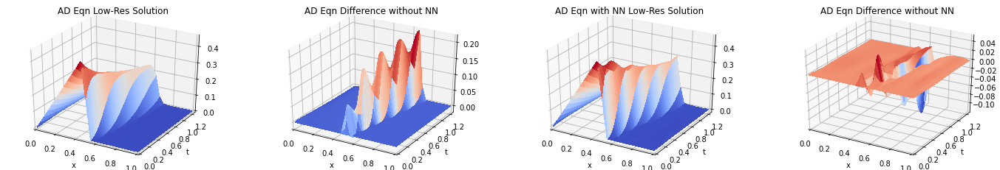

Iterations: 100%|██████████| 12/12 [05:03<00:00, 25.29s/it]
Epoch 0081 | Train Loss 0.064561 | Val Loss 0.079300 | LR 0.0066| Time Elapsed 5.1854 mins
Iterations: 100%|██████████| 12/12 [05:12<00:00, 26.06s/it]
Epoch 0082 | Train Loss 0.065595 | Val Loss 0.078722 | LR 0.0064| Time Elapsed 5.1862 mins


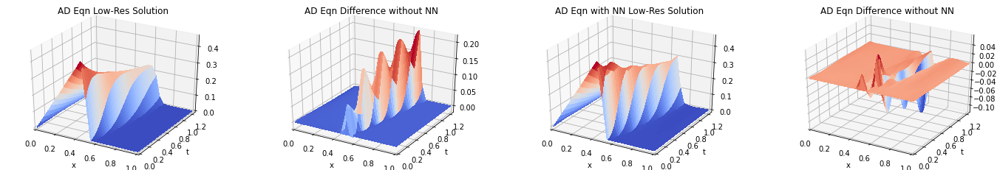

Iterations: 100%|██████████| 12/12 [05:06<00:00, 25.57s/it]
Epoch 0083 | Train Loss 0.082753 | Val Loss 0.076208 | LR 0.0062| Time Elapsed 5.1841 mins
Iterations: 100%|██████████| 12/12 [05:24<00:00, 27.03s/it]
Epoch 0084 | Train Loss 0.056133 | Val Loss 0.079177 | LR 0.0060| Time Elapsed 5.1907 mins


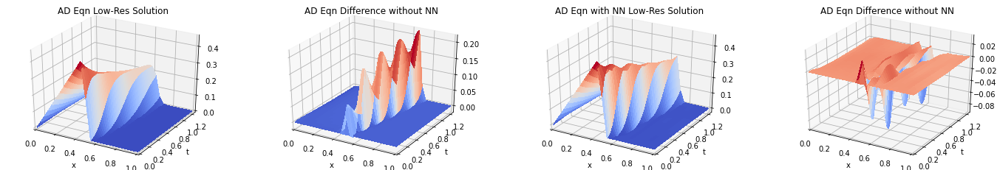

Iterations: 100%|██████████| 12/12 [05:29<00:00, 27.43s/it]
Epoch 0085 | Train Loss 0.078111 | Val Loss 0.078710 | LR 0.0058| Time Elapsed 5.1996 mins
Iterations: 100%|██████████| 12/12 [05:07<00:00, 25.64s/it]
Epoch 0086 | Train Loss 0.084503 | Val Loss 0.081920 | LR 0.0056| Time Elapsed 5.1974 mins


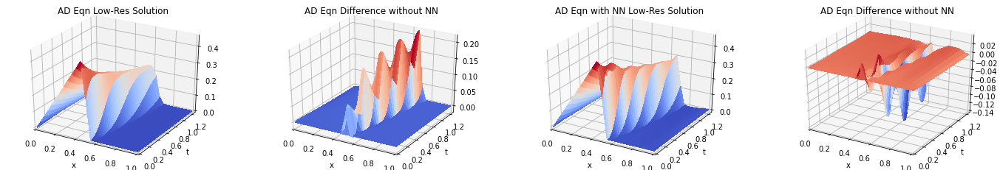

Iterations: 100%|██████████| 12/12 [05:21<00:00, 26.77s/it]
Epoch 0087 | Train Loss 0.037166 | Val Loss 0.077344 | LR 0.0055| Time Elapsed 5.2021 mins
Iterations: 100%|██████████| 12/12 [05:19<00:00, 26.63s/it]
Epoch 0088 | Train Loss 0.043607 | Val Loss 0.073271 | LR 0.0053| Time Elapsed 5.2058 mins


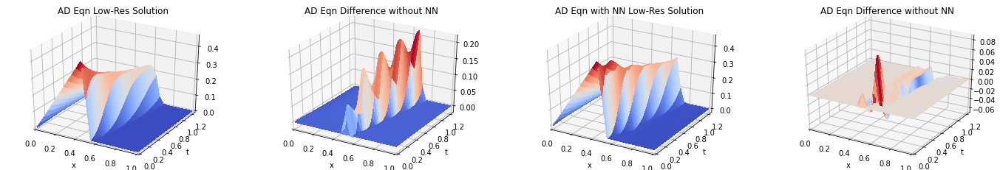

Iterations: 100%|██████████| 12/12 [05:22<00:00, 26.87s/it]
Epoch 0089 | Train Loss 0.063978 | Val Loss 0.080054 | LR 0.0051| Time Elapsed 5.2109 mins
Iterations: 100%|██████████| 12/12 [05:05<00:00, 25.43s/it]
Epoch 0090 | Train Loss 0.054264 | Val Loss 0.086973 | LR 0.0050| Time Elapsed 5.2071 mins


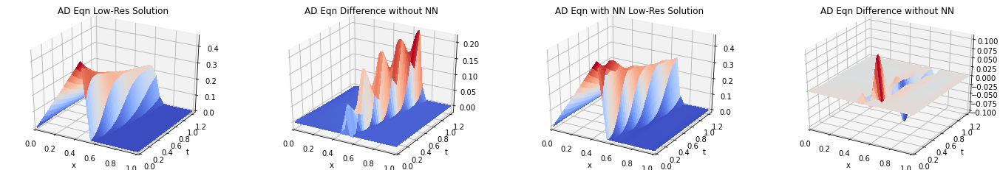

Iterations: 100%|██████████| 12/12 [05:23<00:00, 26.99s/it]
Epoch 0091 | Train Loss 0.044523 | Val Loss 0.086055 | LR 0.0048| Time Elapsed 5.2128 mins
Iterations: 100%|██████████| 12/12 [05:14<00:00, 26.22s/it]
Epoch 0092 | Train Loss 0.063555 | Val Loss 0.086370 | LR 0.0047| Time Elapsed 5.2138 mins


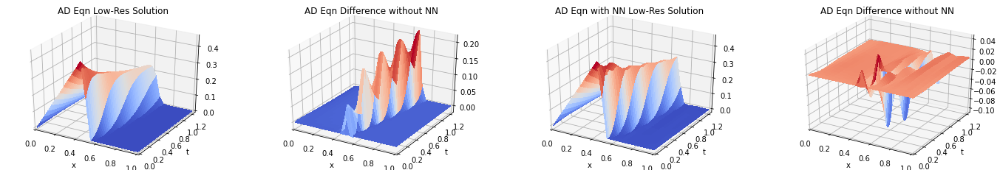

Iterations: 100%|██████████| 12/12 [05:10<00:00, 25.88s/it]
Epoch 0093 | Train Loss 0.045409 | Val Loss 0.081134 | LR 0.0046| Time Elapsed 5.2126 mins
Iterations: 100%|██████████| 12/12 [05:20<00:00, 26.69s/it]
Epoch 0094 | Train Loss 0.041953 | Val Loss 0.077008 | LR 0.0044| Time Elapsed 5.2164 mins


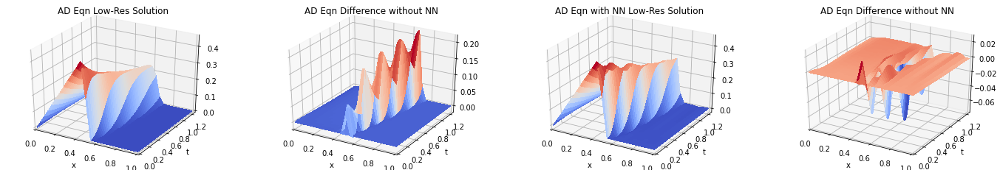

Iterations: 100%|██████████| 12/12 [05:30<00:00, 27.52s/it]
Epoch 0095 | Train Loss 0.051813 | Val Loss 0.081800 | LR 0.0043| Time Elapsed 5.2250 mins
Iterations: 100%|██████████| 12/12 [05:03<00:00, 25.31s/it]
Epoch 0096 | Train Loss 0.037447 | Val Loss 0.079356 | LR 0.0042| Time Elapsed 5.2202 mins


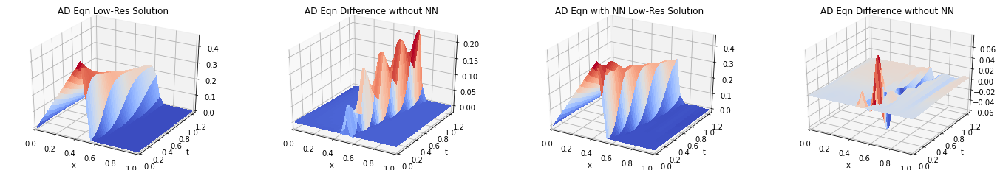

Iterations: 100%|██████████| 12/12 [05:13<00:00, 26.15s/it]
Epoch 0097 | Train Loss 0.052678 | Val Loss 0.078018 | LR 0.0040| Time Elapsed 5.2205 mins
Iterations: 100%|██████████| 12/12 [05:25<00:00, 27.09s/it]
Epoch 0098 | Train Loss 0.061922 | Val Loss 0.078923 | LR 0.0039| Time Elapsed 5.2264 mins


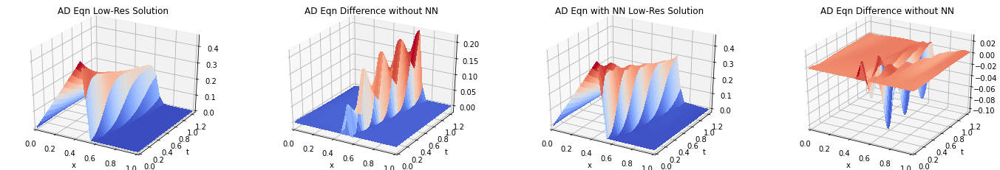

Iterations: 100%|██████████| 12/12 [05:23<00:00, 26.97s/it]
Epoch 0099 | Train Loss 0.073705 | Val Loss 0.078353 | LR 0.0038| Time Elapsed 5.2315 mins
Iterations: 100%|██████████| 12/12 [05:35<00:00, 27.94s/it]
Epoch 0100 | Train Loss 0.070289 | Val Loss 0.080639 | LR 0.0037| Time Elapsed 5.2422 mins


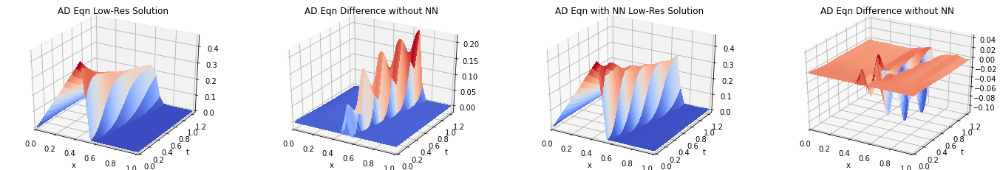

Iterations: 100%|██████████| 12/12 [05:17<00:00, 26.42s/it]
Epoch 0101 | Train Loss 0.057031 | Val Loss 0.081993 | LR 0.0036| Time Elapsed 5.2434 mins
Iterations: 100%|██████████| 12/12 [05:19<00:00, 26.65s/it]
Epoch 0102 | Train Loss 0.068633 | Val Loss 0.081611 | LR 0.0035| Time Elapsed 5.2460 mins


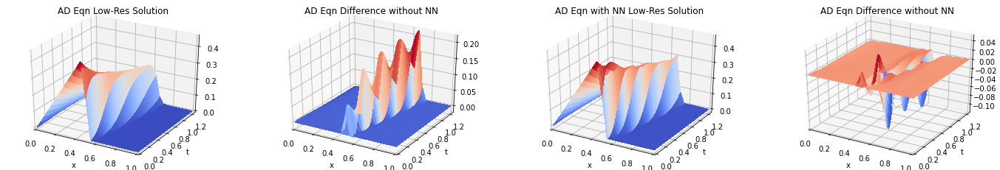

Iterations: 100%|██████████| 12/12 [05:12<00:00, 26.01s/it]
Epoch 0103 | Train Loss 0.062709 | Val Loss 0.087567 | LR 0.0034| Time Elapsed 5.2447 mins
Iterations: 100%|██████████| 12/12 [05:15<00:00, 26.29s/it]
Epoch 0104 | Train Loss 0.052644 | Val Loss 0.085791 | LR 0.0033| Time Elapsed 5.2451 mins


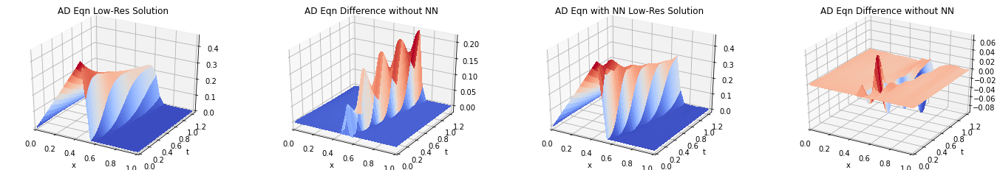

Iterations: 100%|██████████| 12/12 [05:30<00:00, 27.53s/it]
Epoch 0105 | Train Loss 0.043612 | Val Loss 0.080971 | LR 0.0032| Time Elapsed 5.2529 mins
Iterations: 100%|██████████| 12/12 [05:19<00:00, 26.64s/it]
Epoch 0106 | Train Loss 0.037370 | Val Loss 0.095851 | LR 0.0031| Time Elapsed 5.2552 mins


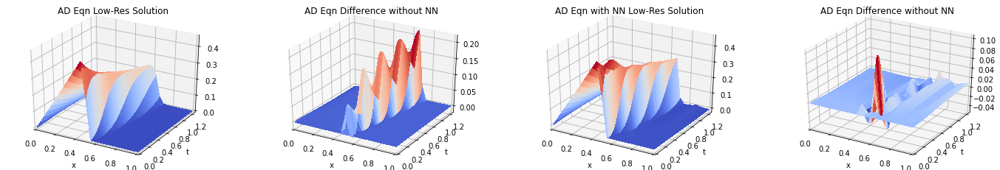

Iterations: 100%|██████████| 12/12 [05:14<00:00, 26.19s/it]
Epoch 0107 | Train Loss 0.031927 | Val Loss 0.082102 | LR 0.0030| Time Elapsed 5.2547 mins
Iterations: 100%|██████████| 12/12 [05:23<00:00, 26.92s/it]
Epoch 0108 | Train Loss 0.044207 | Val Loss 0.081496 | LR 0.0029| Time Elapsed 5.2586 mins


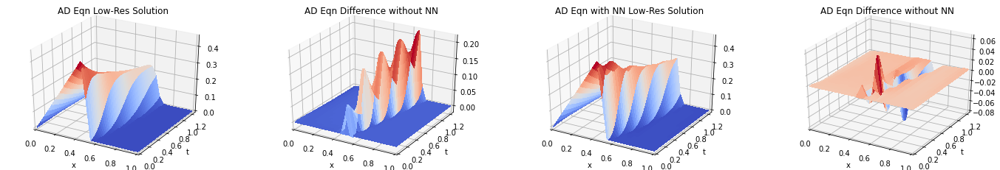

Iterations: 100%|██████████| 12/12 [05:22<00:00, 26.85s/it]
Epoch 0109 | Train Loss 0.041768 | Val Loss 0.086419 | LR 0.0028| Time Elapsed 5.2619 mins
Iterations: 100%|██████████| 12/12 [05:03<00:00, 25.27s/it]
Epoch 0110 | Train Loss 0.039338 | Val Loss 0.083536 | LR 0.0027| Time Elapsed 5.2556 mins


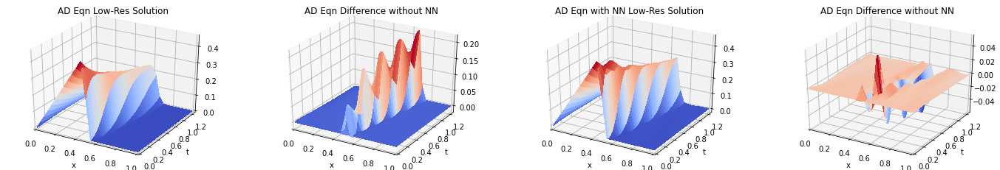

Iterations: 100%|██████████| 12/12 [05:20<00:00, 26.75s/it]
Epoch 0111 | Train Loss 0.040102 | Val Loss 0.084500 | LR 0.0026| Time Elapsed 5.2584 mins
Iterations: 100%|██████████| 12/12 [05:12<00:00, 26.03s/it]
Epoch 0112 | Train Loss 0.034532 | Val Loss 0.084992 | LR 0.0026| Time Elapsed 5.2569 mins


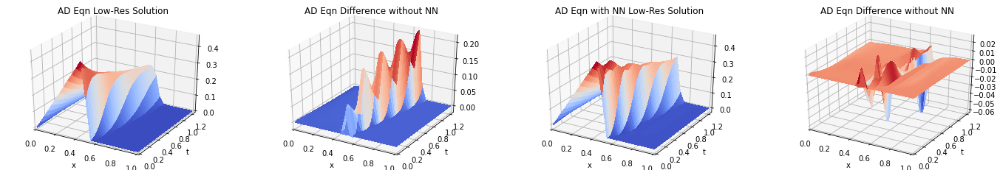

Iterations: 100%|██████████| 12/12 [05:18<00:00, 26.53s/it]
Epoch 0113 | Train Loss 0.029279 | Val Loss 0.083380 | LR 0.0025| Time Elapsed 5.2584 mins
Iterations: 100%|██████████| 12/12 [05:24<00:00, 27.02s/it]
Epoch 0114 | Train Loss 0.023670 | Val Loss 0.086989 | LR 0.0024| Time Elapsed 5.2628 mins


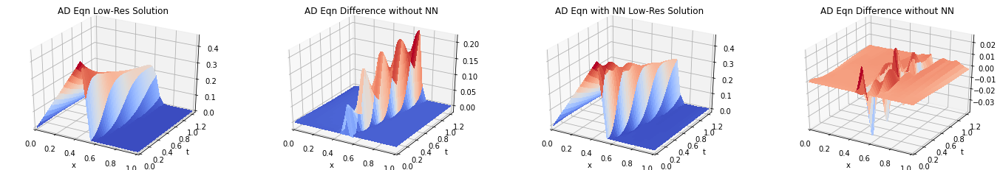

Iterations: 100%|██████████| 12/12 [05:23<00:00, 26.93s/it]
Epoch 0115 | Train Loss 0.028046 | Val Loss 0.087038 | LR 0.0023| Time Elapsed 5.2665 mins
Iterations: 100%|██████████| 12/12 [05:29<00:00, 27.46s/it]
Epoch 0116 | Train Loss 0.026720 | Val Loss 0.088549 | LR 0.0023| Time Elapsed 5.2732 mins


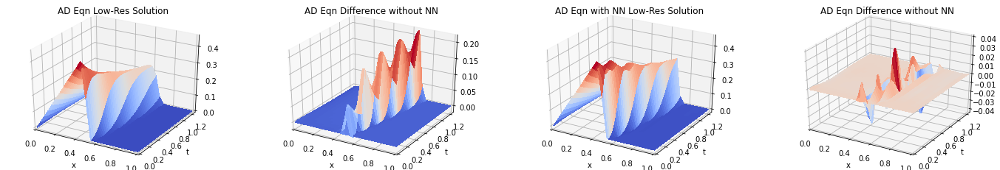

Iterations: 100%|██████████| 12/12 [05:32<00:00, 27.71s/it]
Epoch 0117 | Train Loss 0.036419 | Val Loss 0.089556 | LR 0.0022| Time Elapsed 5.2813 mins
Iterations: 100%|██████████| 12/12 [05:29<00:00, 27.49s/it]
Epoch 0118 | Train Loss 0.048234 | Val Loss 0.083278 | LR 0.0021| Time Elapsed 5.2878 mins


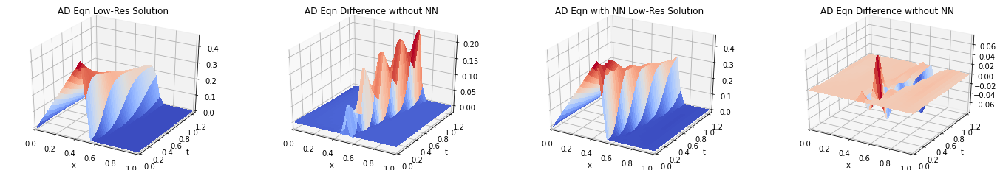

Iterations: 100%|██████████| 12/12 [05:40<00:00, 28.36s/it]
Epoch 0119 | Train Loss 0.042265 | Val Loss 0.085739 | LR 0.0021| Time Elapsed 5.2994 mins
Iterations: 100%|██████████| 12/12 [05:47<00:00, 28.93s/it]
Epoch 0120 | Train Loss 0.041337 | Val Loss 0.086267 | LR 0.0020| Time Elapsed 5.3140 mins


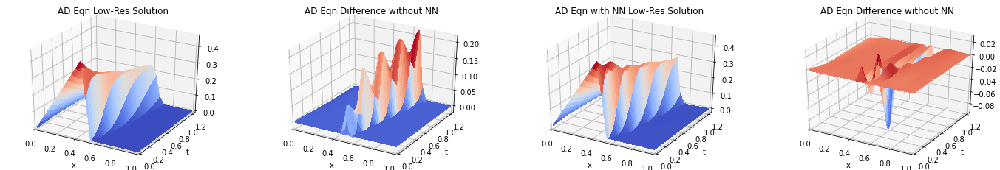

Iterations: 100%|██████████| 12/12 [05:35<00:00, 27.94s/it]
Epoch 0121 | Train Loss 0.055112 | Val Loss 0.087841 | LR 0.0019| Time Elapsed 5.3222 mins
Iterations: 100%|██████████| 12/12 [05:53<00:00, 29.44s/it]
Epoch 0122 | Train Loss 0.048094 | Val Loss 0.087921 | LR 0.0019| Time Elapsed 5.3392 mins


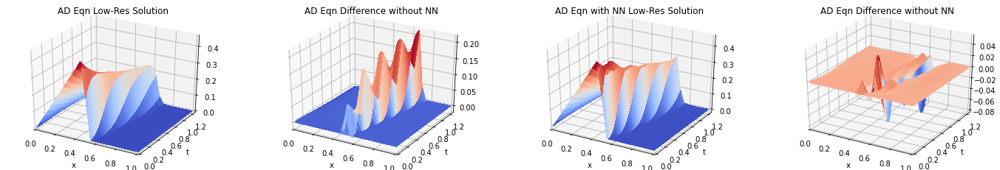

Iterations: 100%|██████████| 12/12 [05:45<00:00, 28.83s/it]
Epoch 0123 | Train Loss 0.044827 | Val Loss 0.090243 | LR 0.0018| Time Elapsed 5.3520 mins
Iterations: 100%|██████████| 12/12 [05:55<00:00, 29.66s/it]
Epoch 0124 | Train Loss 0.053814 | Val Loss 0.088784 | LR 0.0018| Time Elapsed 5.3694 mins


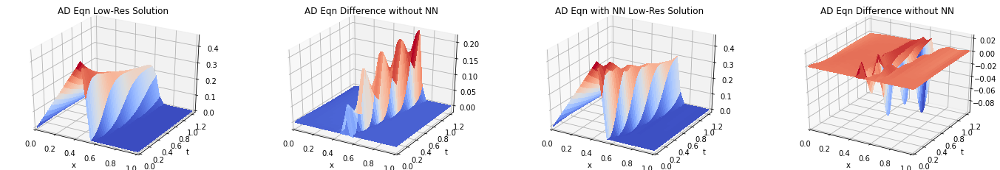

Iterations: 100%|██████████| 12/12 [05:47<00:00, 28.92s/it]
Epoch 0125 | Train Loss 0.057278 | Val Loss 0.084729 | LR 0.0017| Time Elapsed 5.3818 mins
Iterations: 100%|██████████| 12/12 [05:43<00:00, 28.59s/it]
Epoch 0126 | Train Loss 0.054367 | Val Loss 0.088346 | LR 0.0017| Time Elapsed 5.3919 mins


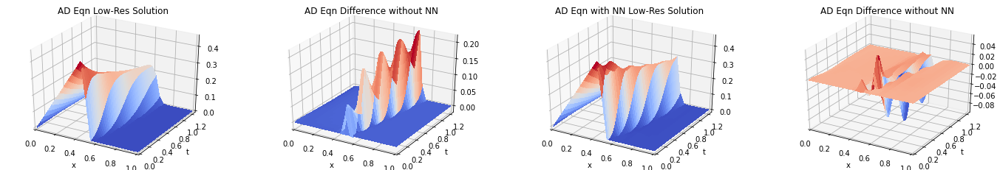

Iterations: 100%|██████████| 12/12 [05:58<00:00, 29.88s/it]
Epoch 0127 | Train Loss 0.048459 | Val Loss 0.089050 | LR 0.0016| Time Elapsed 5.4094 mins
Iterations: 100%|██████████| 12/12 [05:57<00:00, 29.75s/it]
Epoch 0128 | Train Loss 0.048074 | Val Loss 0.092776 | LR 0.0016| Time Elapsed 5.4257 mins


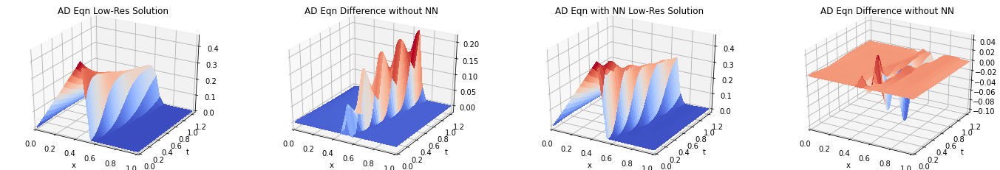

Iterations: 100%|██████████| 12/12 [05:50<00:00, 29.20s/it]
Epoch 0129 | Train Loss 0.042257 | Val Loss 0.090493 | LR 0.0015| Time Elapsed 5.4381 mins
Iterations: 100%|██████████| 12/12 [06:00<00:00, 30.08s/it]
Epoch 0130 | Train Loss 0.051827 | Val Loss 0.084716 | LR 0.0015| Time Elapsed 5.4554 mins


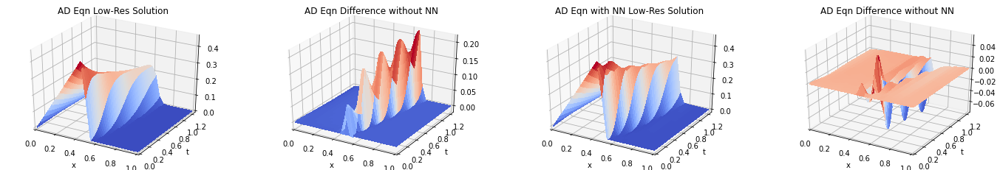

Iterations: 100%|██████████| 12/12 [05:56<00:00, 29.70s/it]
Epoch 0131 | Train Loss 0.052295 | Val Loss 0.089202 | LR 0.0014| Time Elapsed 5.4699 mins
Iterations: 100%|██████████| 12/12 [05:54<00:00, 29.58s/it]
Epoch 0132 | Train Loss 0.033512 | Val Loss 0.090725 | LR 0.0014| Time Elapsed 5.4833 mins


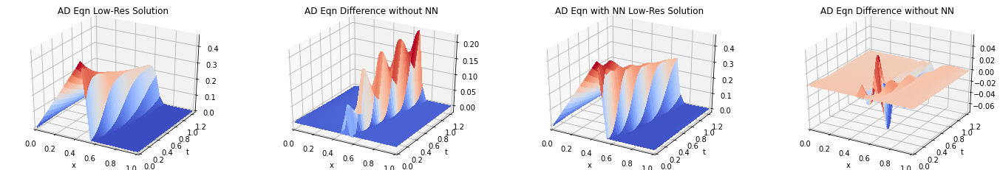

Iterations: 100%|██████████| 12/12 [05:57<00:00, 29.75s/it]
Epoch 0133 | Train Loss 0.030214 | Val Loss 0.093134 | LR 0.0013| Time Elapsed 5.4974 mins
Iterations: 100%|██████████| 12/12 [05:41<00:00, 28.47s/it]
Epoch 0134 | Train Loss 0.033800 | Val Loss 0.090204 | LR 0.0013| Time Elapsed 5.5032 mins


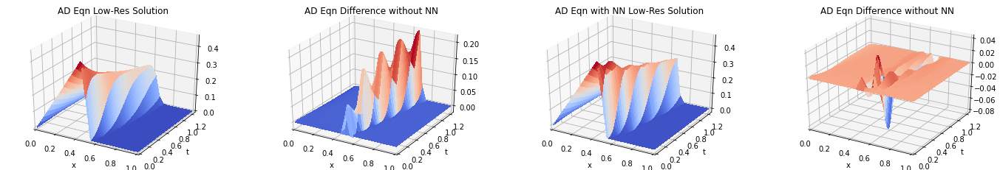

Iterations: 100%|██████████| 12/12 [05:56<00:00, 29.75s/it]
Epoch 0135 | Train Loss 0.041598 | Val Loss 0.090304 | LR 0.0013| Time Elapsed 5.5166 mins
Iterations: 100%|██████████| 12/12 [05:53<00:00, 29.44s/it]
Epoch 0136 | Train Loss 0.041598 | Val Loss 0.091128 | LR 0.0012| Time Elapsed 5.5278 mins


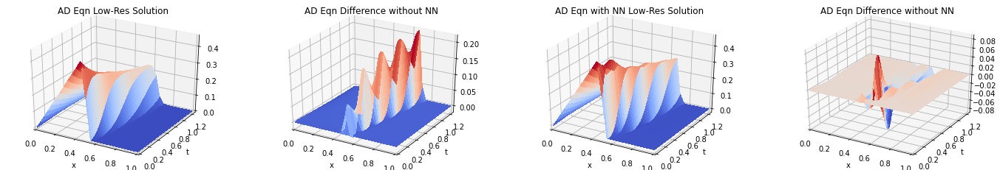

Iterations: 100%|██████████| 12/12 [05:50<00:00, 29.21s/it]
Epoch 0137 | Train Loss 0.043418 | Val Loss 0.090390 | LR 0.0012| Time Elapsed 5.5372 mins
Iterations: 100%|██████████| 12/12 [05:50<00:00, 29.21s/it]
Epoch 0138 | Train Loss 0.044958 | Val Loss 0.089070 | LR 0.0012| Time Elapsed 5.5463 mins


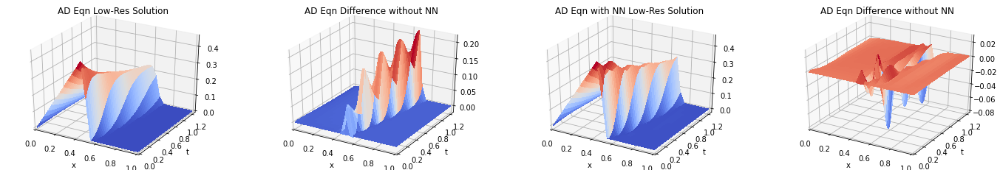

Iterations: 100%|██████████| 12/12 [05:44<00:00, 28.74s/it]
Epoch 0139 | Train Loss 0.043461 | Val Loss 0.092177 | LR 0.0011| Time Elapsed 5.5524 mins
Iterations: 100%|██████████| 12/12 [05:46<00:00, 28.85s/it]
Epoch 0140 | Train Loss 0.036499 | Val Loss 0.090460 | LR 0.0011| Time Elapsed 5.5589 mins


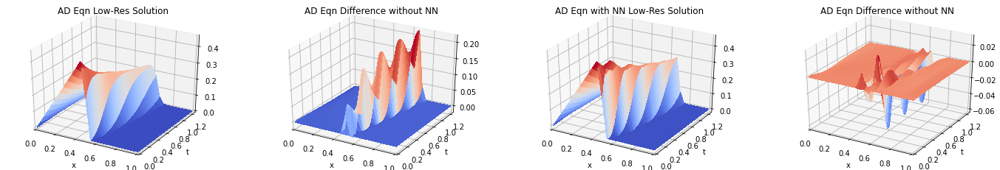

Iterations: 100%|██████████| 12/12 [05:53<00:00, 29.50s/it]
Epoch 0141 | Train Loss 0.034308 | Val Loss 0.088989 | LR 0.0011| Time Elapsed 5.5692 mins
Iterations: 100%|██████████| 12/12 [06:02<00:00, 30.18s/it]
Epoch 0142 | Train Loss 0.036719 | Val Loss 0.092146 | LR 0.0010| Time Elapsed 5.5832 mins


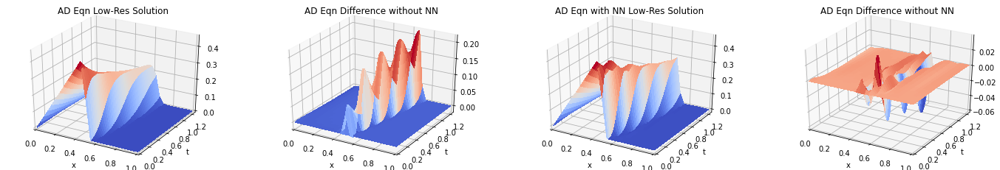

Iterations: 100%|██████████| 12/12 [05:57<00:00, 29.79s/it]
Epoch 0143 | Train Loss 0.036724 | Val Loss 0.089519 | LR 0.0010| Time Elapsed 5.5944 mins
Iterations: 100%|██████████| 12/12 [05:36<00:00, 28.02s/it]
Epoch 0144 | Train Loss 0.035998 | Val Loss 0.094275 | LR 0.0010| Time Elapsed 5.5947 mins


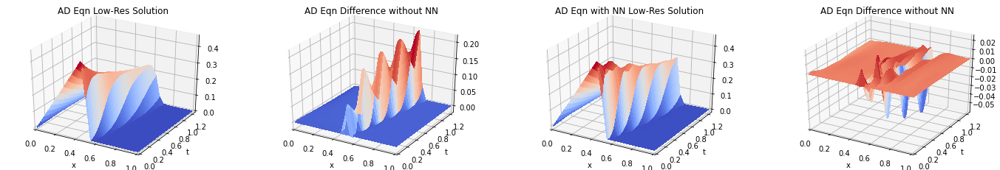

Iterations: 100%|██████████| 12/12 [05:48<00:00, 29.01s/it]
Epoch 0145 | Train Loss 0.038371 | Val Loss 0.093729 | LR 0.0009| Time Elapsed 5.6009 mins
Iterations: 100%|██████████| 12/12 [06:00<00:00, 30.05s/it]
Epoch 0146 | Train Loss 0.037693 | Val Loss 0.091696 | LR 0.0009| Time Elapsed 5.6132 mins


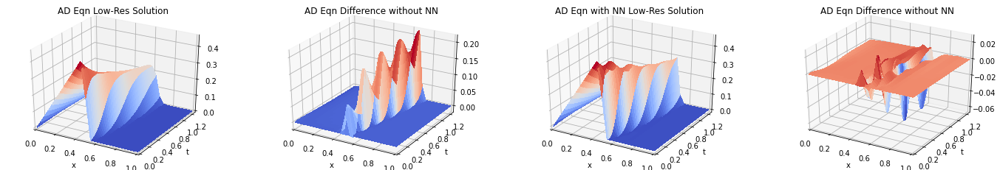

Iterations: 100%|██████████| 12/12 [06:04<00:00, 30.37s/it]
Epoch 0147 | Train Loss 0.038286 | Val Loss 0.093997 | LR 0.0009| Time Elapsed 5.6270 mins
Iterations: 100%|██████████| 12/12 [05:52<00:00, 29.41s/it]
Epoch 0148 | Train Loss 0.035563 | Val Loss 0.090971 | LR 0.0009| Time Elapsed 5.6347 mins


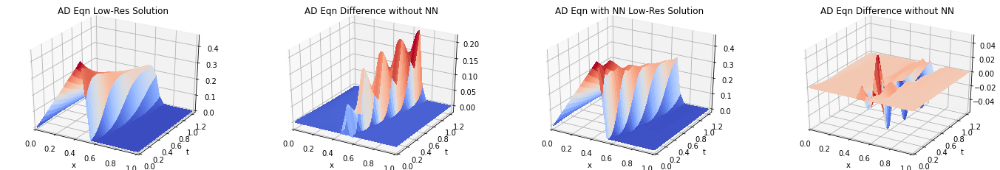

Iterations: 100%|██████████| 12/12 [05:52<00:00, 29.35s/it]
Epoch 0149 | Train Loss 0.039248 | Val Loss 0.092757 | LR 0.0008| Time Elapsed 5.6417 mins
Iterations: 100%|██████████| 12/12 [05:54<00:00, 29.56s/it]
Epoch 0150 | Train Loss 0.036663 | Val Loss 0.092750 | LR 0.0008| Time Elapsed 5.6498 mins


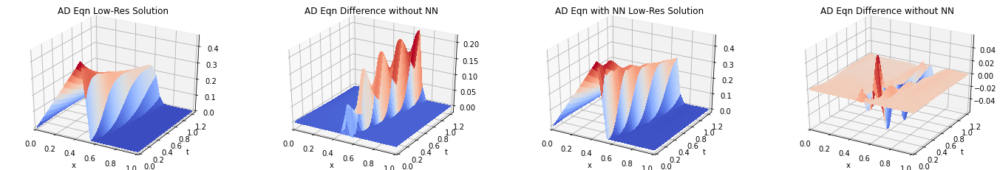

Iterations: 100%|██████████| 12/12 [05:50<00:00, 29.20s/it]
Epoch 0151 | Train Loss 0.038442 | Val Loss 0.090345 | LR 0.0008| Time Elapsed 5.6556 mins
Iterations: 100%|██████████| 12/12 [05:22<00:00, 26.91s/it]
Epoch 0152 | Train Loss 0.039071 | Val Loss 0.092083 | LR 0.0008| Time Elapsed 5.6474 mins


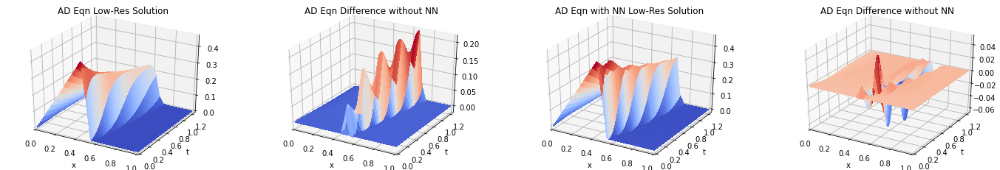

Iterations: 100%|██████████| 12/12 [06:05<00:00, 30.42s/it]
Epoch 0153 | Train Loss 0.036578 | Val Loss 0.094786 | LR 0.0007| Time Elapsed 5.6605 mins
Iterations: 100%|██████████| 12/12 [06:02<00:00, 30.18s/it]
Epoch 0154 | Train Loss 0.039486 | Val Loss 0.092707 | LR 0.0007| Time Elapsed 5.6717 mins


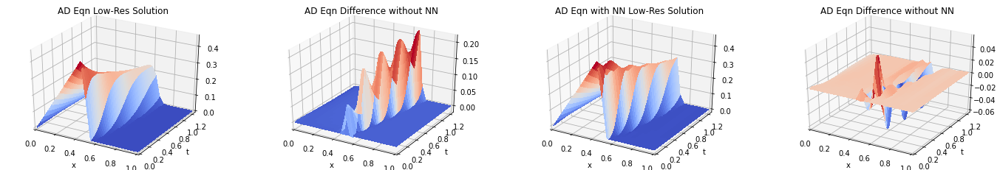

Iterations: 100%|██████████| 12/12 [05:45<00:00, 28.80s/it]
Epoch 0155 | Train Loss 0.039320 | Val Loss 0.092309 | LR 0.0007| Time Elapsed 5.6744 mins
Iterations: 100%|██████████| 12/12 [05:54<00:00, 29.57s/it]
Epoch 0156 | Train Loss 0.039669 | Val Loss 0.093499 | LR 0.0007| Time Elapsed 5.6816 mins


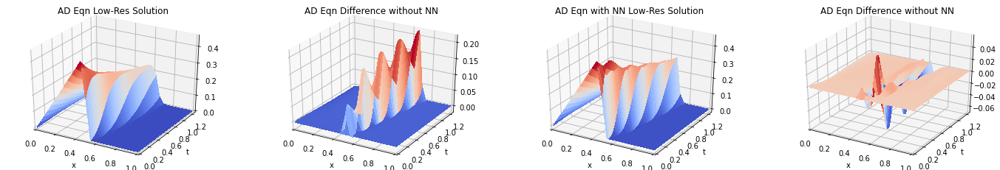

Iterations: 100%|██████████| 12/12 [05:39<00:00, 28.30s/it]
Epoch 0157 | Train Loss 0.039338 | Val Loss 0.095787 | LR 0.0006| Time Elapsed 5.6810 mins
Iterations: 100%|██████████| 12/12 [05:38<00:00, 28.17s/it]
Epoch 0158 | Train Loss 0.038234 | Val Loss 0.093134 | LR 0.0006| Time Elapsed 5.6795 mins


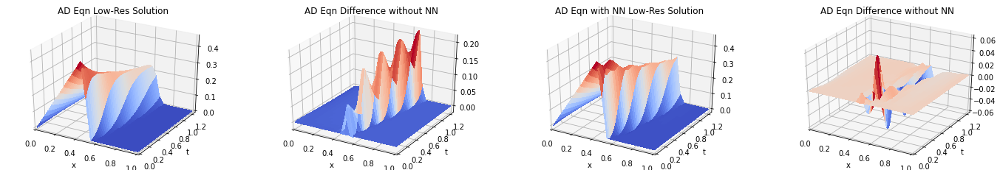

Iterations: 100%|██████████| 12/12 [05:40<00:00, 28.39s/it]
Epoch 0159 | Train Loss 0.040062 | Val Loss 0.093509 | LR 0.0006| Time Elapsed 5.6795 mins
Iterations: 100%|██████████| 12/12 [05:47<00:00, 28.98s/it]
Epoch 0160 | Train Loss 0.041371 | Val Loss 0.090481 | LR 0.0006| Time Elapsed 5.6830 mins


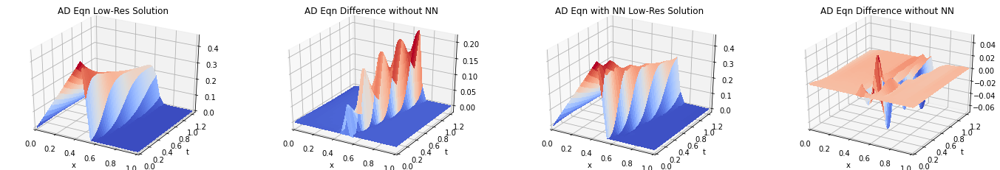

Iterations: 100%|██████████| 12/12 [05:40<00:00, 28.38s/it]
Epoch 0161 | Train Loss 0.046531 | Val Loss 0.090610 | LR 0.0006| Time Elapsed 5.6828 mins
Iterations: 100%|██████████| 12/12 [05:40<00:00, 28.34s/it]
Epoch 0162 | Train Loss 0.049050 | Val Loss 0.089972 | LR 0.0006| Time Elapsed 5.6823 mins


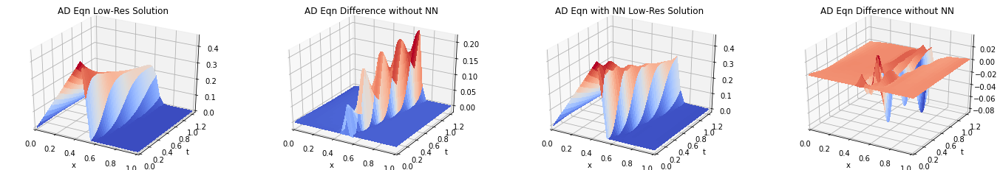

Iterations: 100%|██████████| 12/12 [05:40<00:00, 28.38s/it]
Epoch 0163 | Train Loss 0.045670 | Val Loss 0.092415 | LR 0.0005| Time Elapsed 5.6822 mins
Iterations: 100%|██████████| 12/12 [05:57<00:00, 29.76s/it]
Epoch 0164 | Train Loss 0.039457 | Val Loss 0.094068 | LR 0.0005| Time Elapsed 5.6903 mins


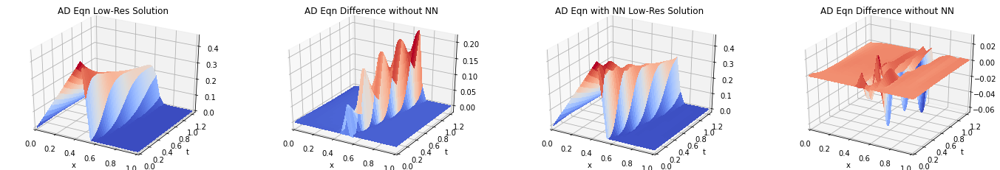

Iterations: 100%|██████████| 12/12 [05:46<00:00, 28.88s/it]
Epoch 0165 | Train Loss 0.039993 | Val Loss 0.092884 | LR 0.0005| Time Elapsed 5.6928 mins
Iterations: 100%|██████████| 12/12 [05:45<00:00, 28.78s/it]
Epoch 0166 | Train Loss 0.044380 | Val Loss 0.091642 | LR 0.0005| Time Elapsed 5.6947 mins


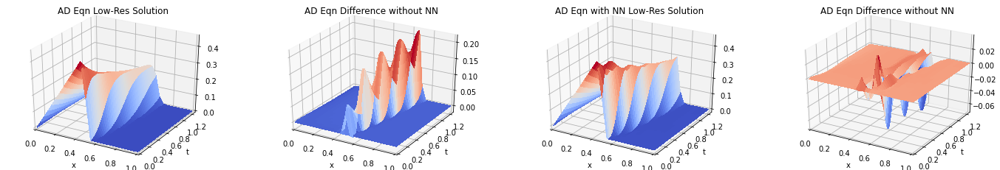

Iterations: 100%|██████████| 12/12 [05:39<00:00, 28.32s/it]
Epoch 0167 | Train Loss 0.044546 | Val Loss 0.092077 | LR 0.0005| Time Elapsed 5.6938 mins
Iterations: 100%|██████████| 12/12 [05:48<00:00, 29.01s/it]
Epoch 0168 | Train Loss 0.042819 | Val Loss 0.092935 | LR 0.0005| Time Elapsed 5.6971 mins


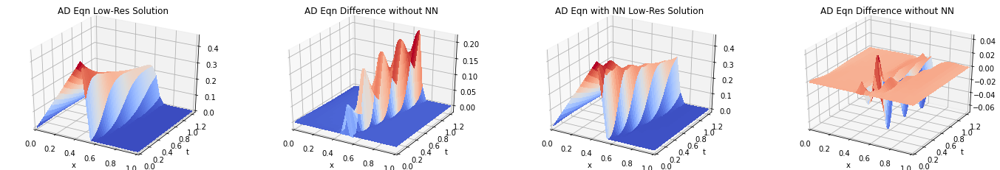

Iterations: 100%|██████████| 12/12 [06:03<00:00, 30.28s/it]
Epoch 0169 | Train Loss 0.043853 | Val Loss 0.093175 | LR 0.0004| Time Elapsed 5.7078 mins
Iterations: 100%|██████████| 12/12 [05:50<00:00, 29.19s/it]
Epoch 0170 | Train Loss 0.043235 | Val Loss 0.092117 | LR 0.0004| Time Elapsed 5.7118 mins


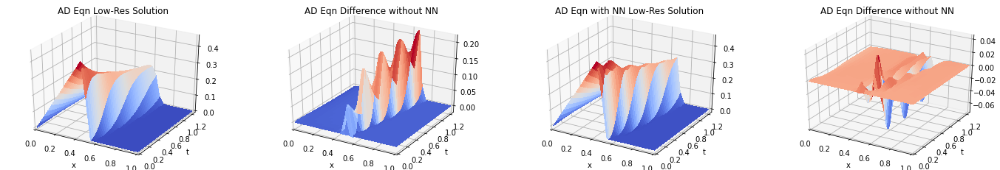

Iterations: 100%|██████████| 12/12 [05:51<00:00, 29.27s/it]
Epoch 0171 | Train Loss 0.040371 | Val Loss 0.092438 | LR 0.0004| Time Elapsed 5.7160 mins
Iterations: 100%|██████████| 12/12 [05:39<00:00, 28.31s/it]
Epoch 0172 | Train Loss 0.040276 | Val Loss 0.092552 | LR 0.0004| Time Elapsed 5.7144 mins


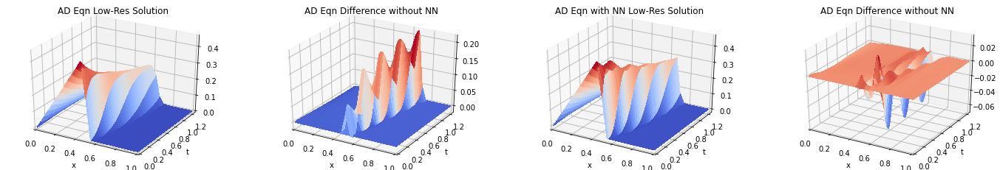

Iterations: 100%|██████████| 12/12 [05:43<00:00, 28.61s/it]
Epoch 0173 | Train Loss 0.038727 | Val Loss 0.092582 | LR 0.0004| Time Elapsed 5.7146 mins
Iterations: 100%|██████████| 12/12 [05:47<00:00, 28.99s/it]
Epoch 0174 | Train Loss 0.038740 | Val Loss 0.094259 | LR 0.0004| Time Elapsed 5.7171 mins


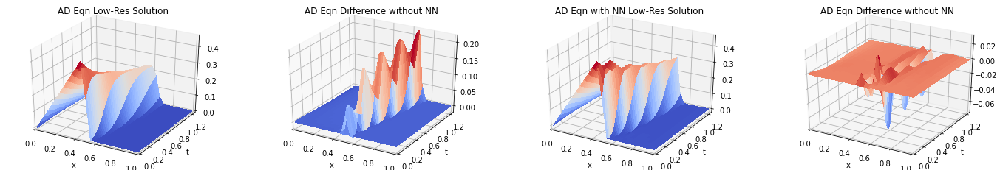

Iterations: 100%|██████████| 12/12 [05:52<00:00, 29.37s/it]
Epoch 0175 | Train Loss 0.038727 | Val Loss 0.093296 | LR 0.0004| Time Elapsed 5.7218 mins
Iterations: 100%|██████████| 12/12 [05:55<00:00, 29.66s/it]
Epoch 0176 | Train Loss 0.038564 | Val Loss 0.093861 | LR 0.0004| Time Elapsed 5.7281 mins


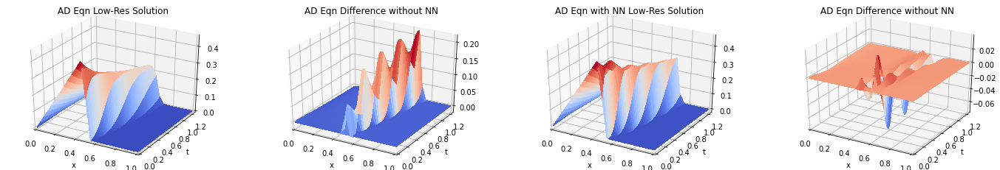

Iterations: 100%|██████████| 12/12 [05:42<00:00, 28.52s/it]
Epoch 0177 | Train Loss 0.040545 | Val Loss 0.093744 | LR 0.0004| Time Elapsed 5.7274 mins
Iterations: 100%|██████████| 12/12 [05:38<00:00, 28.24s/it]
Epoch 0178 | Train Loss 0.042443 | Val Loss 0.092052 | LR 0.0003| Time Elapsed 5.7250 mins


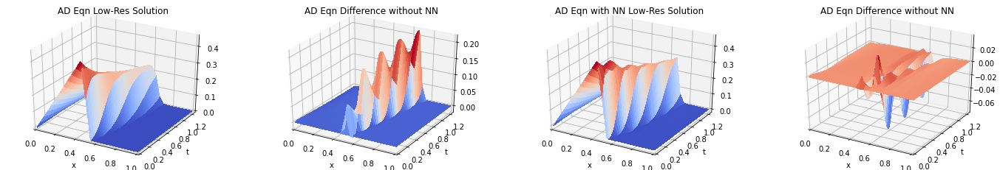

Iterations: 100%|██████████| 12/12 [05:46<00:00, 28.86s/it]
Epoch 0179 | Train Loss 0.040497 | Val Loss 0.092821 | LR 0.0003| Time Elapsed 5.7264 mins
Iterations: 100%|██████████| 12/12 [05:44<00:00, 28.71s/it]
Epoch 0180 | Train Loss 0.040682 | Val Loss 0.093708 | LR 0.0003| Time Elapsed 5.7269 mins


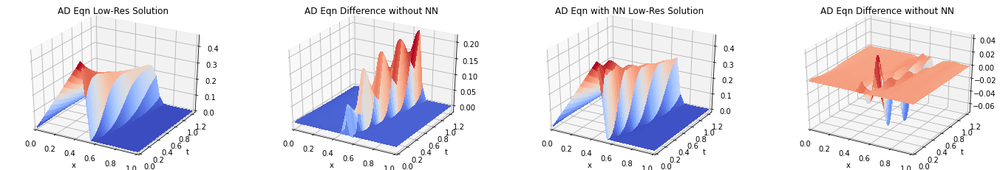

Iterations: 100%|██████████| 12/12 [05:52<00:00, 29.40s/it]
Epoch 0181 | Train Loss 0.042592 | Val Loss 0.093352 | LR 0.0003| Time Elapsed 5.7315 mins
Iterations: 100%|██████████| 12/12 [05:37<00:00, 28.15s/it]
Epoch 0182 | Train Loss 0.042451 | Val Loss 0.093604 | LR 0.0003| Time Elapsed 5.7285 mins


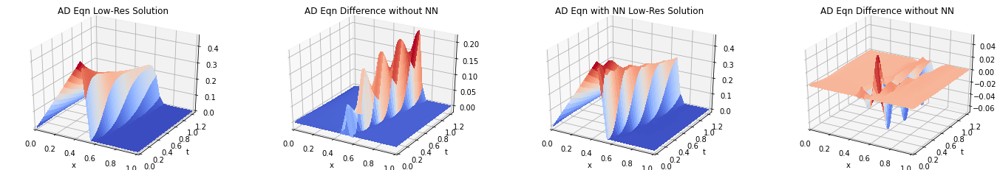

Iterations:  50%|█████     | 6/12 [03:03<03:02, 30.50s/it]

In [ ]:
optimizer = tf.keras.optimizers.RMSprop(learning_rate = lr_schedule)

nDDE_train_obj = ndde.train_nDDE(func = func, adj_func = adj_func, d = [args.rnn_nmax, args.rnn_dt], loss_obj = loss_obj, batch_obj = get_batch,
                            optimizer = optimizer, args = args, plot_obj = plot_obj, time_meter = time_meter, checkpoint_dir = checkpoint_prefix, 
                            validation_obj = val_obj, loss_history_obj = loss_history)

nDDE_train_obj.train(true_u_low_res, u0, t, val_true_u_low_res)